# Week 4 - Semantic & Influence Networks

This week, we explore the representation and analysis of semantic and influence networks. We begin by introducing you to some straightforward approaches to network analysis. We then begin to illustrate them with word networks that we can analyze to understand the structure of how words connect with one another, and the dynamics of how their meanings flow through a discursive system. For example, we can define links between words as a function of their co-presence within a document, chapter, paragraph, sentence, noun phrase or continuous bag of words. We can also define links as a function of words that rely on one another within a directed dependency parse, or links between extracted Subjects, Verbs and Objects, or nouns and the adjectives that modify them (or verbs and the adverbs that modify them). Rendering words linked as a network or discrete topology allows us to take advantage of the network analysis metrics like centrality and community.

Texts also represent moves in a social game, and we can analyze the interchange of words and phrases within them in order to understand more about the relationships between people, groups and organizations that interact with one another. For example, who influences whom? And in a singular conversation--like a discussion of tweets on comments in Facebook--or over vast stretches of time (e.g., How much was Kant influenced by Aristotle? by Plato? Was _Chinatown_ director Robert Towne influenced by Sophocles?) We will do this by extracting conversational moves from text. But note that the similarity measures from last week's homework can also be used to represent a matrix of similarities--and potential influences--from one document to another. Rendering social actors or documentary events (e.g., a book) linked as a network or discrete topology allows us to take advantage of the wide range of metrics and models developed for network analysis. These include measurement of network centrality, density and modularity, "block modeling" structurally equivalent relationships, and sophisticated graphical renderings of networks or network partitions that allow us to visually interrogate their structure and complexity of social relations. Moreover, we can link explicit social interactions (e.g., "friendship" on Facebook, coupling in a romantic relationship, etc.) with semantic networks to better make sense of how pepole (inter)act in the world. 

For this notebook we will use the following packages:

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud_2020 #pip install -U git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git

#All these packages need to be installed from pip

#This will be doing most of the work
import networkx as nx

import sklearn #For generating some matrices
import pandas #For DataFrames
import numpy as np #For arrays
import matplotlib.pyplot as plt #For plotting
import seaborn #Makes the plots look nice
import scipy #Some stats
import nltk #a little language code
from IPython.display import Image #for pics

import pickle #if you want to save layouts
import os

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

# An Introduction to networks in *networkx*

We will primarily be dealing with graphs in this notebook, so lets first go over how to use them.

To start with lets create an undirected graph:

In [2]:
g = nx.Graph()
g

We can add nodes. These are all named, like entries in a dictionary.

In [3]:
g.add_node(1)
g.add_node(2)
g.add_node(3)

Now we have 3 vertices:

In [4]:
len(g.nodes)

3

Or if we want to get more information about the graph:

In [5]:
print(nx.info(g))

Name: 
Type: Graph
Number of nodes: 3
Number of edges: 0
Average degree:   0.0000


We can give nodes properties, like name or type

In [6]:
g.nodes[1]

{}

In [7]:
g.nodes[1]['type'] = 'NN'

In [8]:
g.nodes[1]

{'type': 'NN'}

In [9]:
g.nodes[2]['name'] = 'dog'

In [10]:
g.nodes[2]

{'name': 'dog'}

Still pretty boring...

Lets add a couple of edges. Notice that we use the ids, but not any of the properties:

In [11]:
g.add_edges_from([(1, 2), (2, 3), (3, 1), (1,4)])
print(nx.info(g))

Name: 
Type: Graph
Number of nodes: 4
Number of edges: 4
Average degree:   2.0000


Note how the summary has changed. Moreover, there's one additional node, because we asked for an edge to 4.

We can also give the edges properties like weights:

In [12]:
g.edges[1, 2]['weight'] = 2
g.edges[1, 4]['weight'] = 2
g.edges[1, 4]

{'weight': 2}

Let's visualize our graph now:

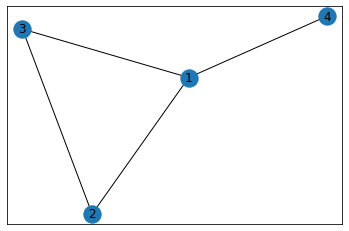

In [13]:
nx.draw_networkx(g)
plt.savefig("test.png")

Very exciting :-).

There are many things to do with the graph once we have created it, some of which we will explore here with a word semantic network.

First let's load some data: the Grimmer Senate press release corpus:

In [14]:
senReleasesDF = pandas.read_csv('../data/senReleasesTraining.csv', index_col = 0)
senReleasesDF[:3]

,download_url,html_url,name,path,text,targetSenator
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Apr2005Kennedy14.txt,raw/Kennedy/01Apr2005Kennedy14.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,Kennedy
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Aug2005Kennedy12.txt,raw/Kennedy/01Aug2005Kennedy12.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,Kennedy
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Aug2006Kennedy10.txt,raw/Kennedy/01Aug2006Kennedy10.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,Kennedy


We will be extracting sentences, as well as tokenizing and stemming. (You should be able to do this in your sleep now).

In [15]:
senReleasesDF['tokenized_sents'] = senReleasesDF['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
senReleasesDF['normalized_sents'] = senReleasesDF['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

Let's begin by looking at words that co-occur in the same sentences:

In [16]:
def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        return g

First, build a graph based on word cooccurences in the first 100 press releases.

In [17]:
g = wordCooccurrence(senReleasesDF['normalized_sents'][:100].sum())

Total number of vertices:

In [18]:
len(g.nodes)

4710

Total number of edges:

In [19]:
len(g.edges)

179328

A part of the adjacency matrix of cleaned word by press releases:

In [20]:
nx.to_numpy_matrix(g)[:10, :10]

matrix([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 2., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

We can save the graph and read it later, although this is slow if there are many edges or nodes, so we will filter first, as we will demonstrate below.

In [21]:
#nx.write_graphml(g, '../data/Obama_words.graphml')

Alternatively, we can build graphs starting with a two-mode network. Let's again use the document-word frequency matrix that we used in week 3.

In [22]:
def tokenize(text):
    tokenlist = lucem_illud_2020.word_tokenize(text)
    normalized = lucem_illud_2020.normalizeTokens(tokenlist)
    return normalized

In [23]:
import sklearn.feature_extraction
# in case we get a module not found error

In [24]:
senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
senVects_incidence = senVectorizer.fit_transform(senReleasesDF['text'][:100])

In [25]:
senVects_incidence.shape

(100, 4710)

We need to turn the incidence matrix into a network. Note the use of bipartite as an attribute--this is how you need to tell networkx the graph is bipartite:

In [26]:
g_2mode = nx.Graph()

#define all the nodes
g_2mode.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence.shape[1])), bipartite = 'word')
g_2mode.add_nodes_from(range(senVects_incidence.shape[0]), bipartite = 'doc')

#add all the edges
g_2mode.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence[d, w]}) for d, w in zip(*senVects_incidence.nonzero())))

In [27]:
print(nx.info(g_2mode))

Name: 
Type: Graph
Number of nodes: 4810
Number of edges: 21005
Average degree:   8.7339


A very popular layout algorithm for visualizing graphs is the Fruchterman-Reingold Algorithm (or spring layout), which uses a physical metaphor for lay-out. Nodes repel one another, and edges draw connected elements together like springs. The algorithm attempts to minimize the energy in such a system. For a large graph, however, the algorithm is computational demanding. 

Let's plot the bipartite network with a quick spring layout:

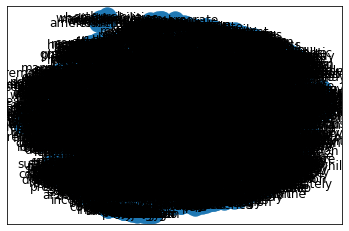

In [28]:
nx.draw_networkx(g_2mode)

With no filtering, this will not bring insight (see below). If we want even faster computation and tunable visualizations, check out [Pajek](http://mrvar.fdv.uni-lj.si/pajek/) or [gephi](https://gephi.org/).

A two-mode network can be easily transformed into two one-mode network, enabling words to be connected to other words via the number of documents that share them, or documents to be connected to other documents via the words they share:

In [29]:
def contractNetwork(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g_2mode.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g_2mode.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [30]:
gDoc = contractNetwork(g_2mode, 'doc')

Let's first take a look at the document-to-document network:

In [31]:
print(nx.info(gDoc))

Name: 
Type: Graph
Number of nodes: 100
Number of edges: 4950
Average degree:  99.0000


Let's construct a visualization. It is not surprising that almost every document is connected to every other. We can use edge weight to distinguish document distance (modeled as attraction):

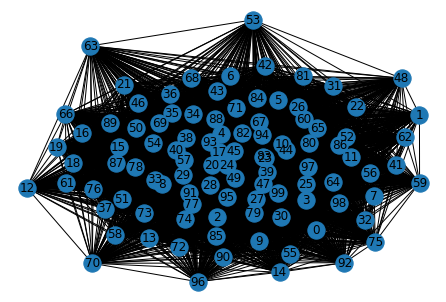

In [32]:
layout = nx.spring_layout(gDoc, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}) #Getting labels is a bit annoying

Lets draw the graph with high and low weight edges distinguished:

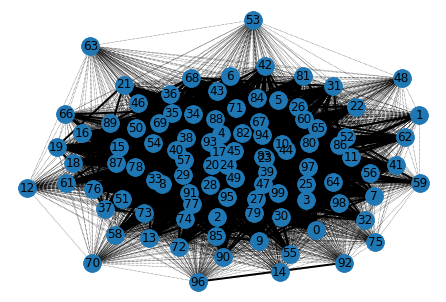

In [33]:
wMedian = np.median([d['weight'] for n1, n2, d in gDoc.edges(data = True)])
edgesHigh = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] > wMedian]
edgesLow = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] <= wMedian]
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}, edgelist = edgesLow, style='dotted', width=.5)
nx.draw(gDoc, pos = layout, nodelist=None, edgelist = edgesHigh, width=2)

Now we can see why 53 and 63 are on the outside, while 39 and 23 are at the center. We can look at them:

In [34]:
print(len(senReleasesDF.iloc[63]['text']),"words:","\n",senReleasesDF.iloc[63]['text'].strip().replace('  ', '\n'))

314 words: 
 FOR IMMEDIATE RELEASE

Senator Kennedy issued the following statement this evening following Senator Kerrys apology

John Kerry s statement says it all
I wish the Bush administration brought as much energy and focus to trying to correct their mistakes in Iraq as it did in going after John Kerry


In [35]:
print(len(senReleasesDF.iloc[23]['text']),"words:","\n",senReleasesDF.iloc[23]['text'].strip().replace('  ', '\n'))

20603 words: 
 FOR IMMEDIATE RELEASE
REID

 We re sorry that we re starting a little bit late
but the House has some votes going
and so Leader Pelosi will be here and Congresswoman Solis real soon

 I m reminded of the story I learned as a little boy
When the kid was watching the sheep and he was supposed to yell
Wolf
when the wolf was coming
And he yelled
Wolf
as we know

Wolf
Wolf
and there was never any wolf
And finally when a wolf showed up
no one came

 And no matter how hard we try to be bipartisan here in Washington
with President Bush it s the proverbial cry for wolf

 As I said leaving the chamber last night
whatever he says
it s just the opposite

 And we re here today to talk about health care
But the cry of wolf is once again ringing in my ears because he keeps talking about how he wants to improve health care and we re now five years into this and there s been no improvement

 In fact
I hope the president mentions when he s in Tennessee today that there s almost a million 

Ah...those documents with the **most** words are unsprisingly the most central in this simple document network.

Now let's turn it around and look at the word-to-word network by documents. 

In [36]:
gWord = contractNetwork(g_2mode, 'word')
print(nx.info(gWord))

Name: 
Type: Graph
Number of nodes: 4710
Number of edges: 2063890
Average degree: 876.3864


First, let's reduce the number of words to a manageable size.

In [37]:
wMean = np.mean([d['weight'] for n1, n2, d in gWord.edges(data = True)])
wMean

1.7778965933261948

We are going to return to the sentence cooccurence graph, as it suggests many more meaningful (more local) associations. But without filtering, it is too large. Let's first drop all the edges with weight below 25, then drop all the isolates. You are recommended to play with the weight here to see how the graph might look different.

In [38]:
g = wordCooccurrence(senReleasesDF['normalized_sents'][:100].sum())

In [39]:
len(g)

4710

In [40]:
g.remove_edges_from([(n1, n2) for n1, n2, d in g.edges(data = True) if d['weight'] <= 25])

In [41]:
g.remove_nodes_from(list(nx.isolates(g))) #since we are changing the graph list() evaluates the isolates first

In [42]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

In [43]:
giant = max(connected_component_subgraphs(g), key=len) # keep just the giant connected component
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 158
Number of edges: 458
Average degree:   5.7975


A bit smaller now, Now, let's visualize it: 

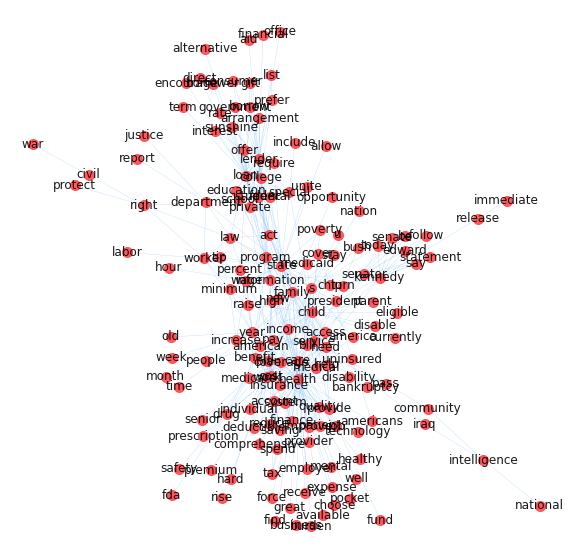

In [44]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

In [45]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(giant))

Let us use this oppurtunity to introduce a concept of finding communities in graphs: a popular one is the modularity measure, introduced in: Clauset, A., Newman, M. E., & Moore, C. “Finding community structure in very large networks.” Physical Review E 70(6), 2004.

networkx implements this through the above method. It yields sets of nodes, one for each community.

In [46]:
c

[frozenset({'access',
            'account',
            'act',
            'aid',
            'allow',
            'alternative',
            'america',
            'american',
            'americans',
            'arrangement',
            'available',
            'bankruptcy',
            'be',
            'benefit',
            'bill',
            'borrow',
            'borrower',
            'burden',
            'bush',
            'business',
            'care',
            'child',
            'chip',
            'choose',
            'civil',
            'college',
            'community',
            'comprehensive',
            'consumer',
            'cost',
            'cover',
            'coverage',
            'currently',
            'deductible',
            'department',
            'direct',
            'disability',
            'disable',
            'drug',
            'education',
            'edward',
            'eligible',
            'employer',
            '

We can also remove those words that show up in many documents...those with many connections (note that this has a similar effect to selecting those with a high tf.idf score). Note that for this case we get the same graph; this is just to demonstrate the different kinds of node dropping and graph changes we can do.

In [47]:
giant = nx.Graph(giant)

In [48]:
giant.remove_nodes_from([n for n in giant.nodes if len(set(giant.neighbors(n))) >= 2000]) 
giant.remove_nodes_from(list(nx.isolates(giant)))
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 158
Number of edges: 458
Average degree:   5.7975


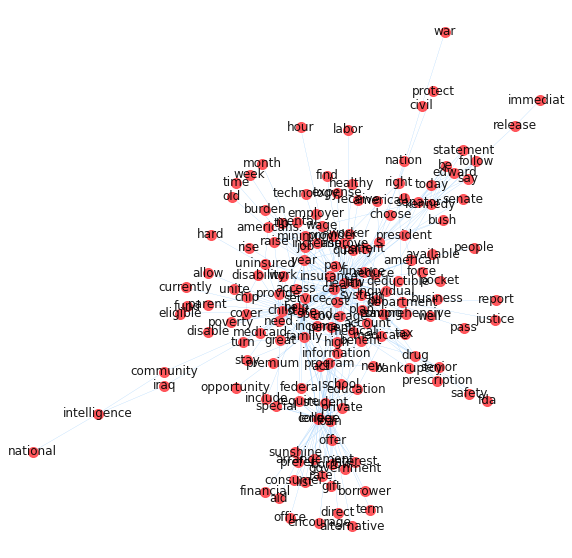

In [49]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

We can continue to trim globally to investigate the structure of words at alternative slices of network density. 

Moreover, we can find cliques, or completely connected sets of nodes. 

In [50]:
print(', '.join(max(nx.clique.find_cliques(giant), key = lambda x: len(x))))

health, care, need, child, state, family, year


Now lets look at a subgraph of the network, those nodes that are within 1 or 2 network steps of 'america'. 

In [51]:
americanNeighbors = giant.neighbors('american')
g_american = giant.subgraph(americanNeighbors)
print(nx.info(g_american))

Name: 
Type: Graph
Number of nodes: 5
Number of edges: 11
Average degree:   4.4000


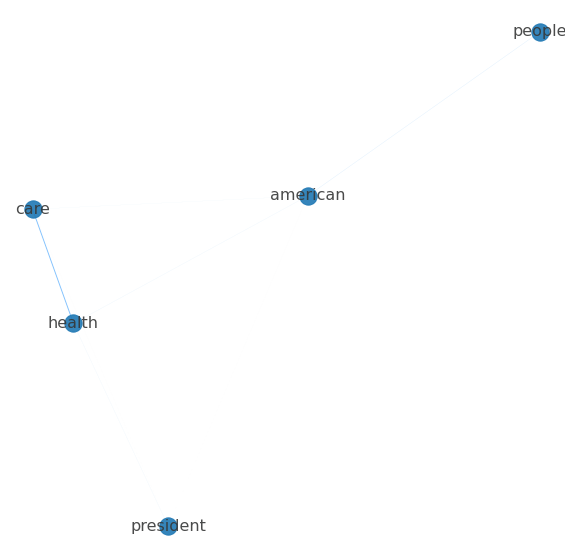

In [52]:
layout_amer = nx.spring_layout(g_american, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
maxWeight = max((d['weight'] for n1, n2, d in g_american.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_american.edges(data = True)))
nx.draw(g_american, ax = ax, pos = layout_amer, labels = {n:n for n in g_american.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_american.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

In [53]:
americanNeighbors = gWord.neighbors('american')
americanNeighborsPlus1 = set(americanNeighbors)
for n in americanNeighbors:
    americanNeighborsPlus1 |= set(giant.neighbors(n))
    
#for x in americanNeighborsPlus1:
#    print(x)

In [54]:
g_american2 = giant.subgraph(americanNeighborsPlus1)
print(nx.info(g_american2))

Name: 
Type: Graph
Number of nodes: 154
Number of edges: 447
Average degree:   5.8052


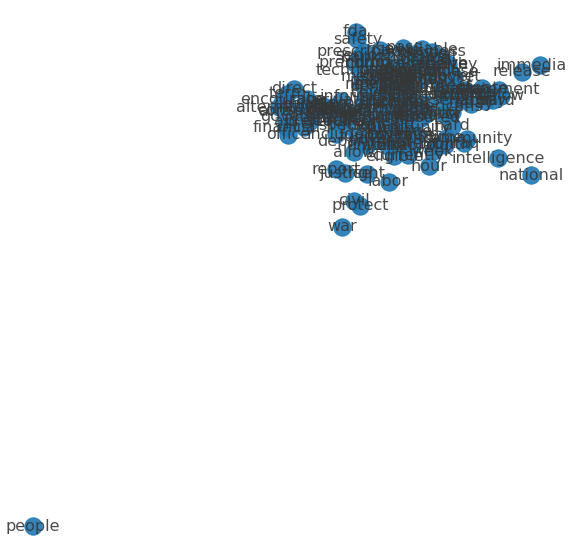

In [55]:
layout_amer = nx.spring_layout(g_american2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_amer = nx.eigenvector_centrality(g_american2)
maxC = max(centralities_amer.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in g_american2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_american2.edges(data = True)))
nx.draw(g_american2, ax = ax, pos = layout_amer, labels = {n:n for n in g_american2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_american2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Construct cells immediately below this that render networks to meaningfully characterize the structure of words and documents (or subdocuments like chapters or paragraphs) from your corpus. What are useful filters and thresholds and what semantic structures do they reveal that give insight into the social world and social game inscribed in your corpus? Interrogate interesting subgraphs of your network and detail what they reveal about the semantic space involved.

In this part, I want to analyze the first book of Bible. There are many versions of Bible, and here we use the version of American Standard-ASV1901. The dataset comes from https://www.kaggle.com/oswinrh/bible#bible_version_key.csv.

In [56]:
bible = pandas.read_csv('C:\\Users\\mac\\Desktop\\Content-Analysis-2020\\week-4\\t_asv_1.csv')
bible

,id,book,chapter,verse,text
0,1001001,1,1,1,In the beginning God created the heavens and t...
1,1001002,1,1,2,And the earth was waste and void; and darkness...
2,1001003,1,1,3,"And God said, Let there be light: and there wa..."
3,1001004,1,1,4,"And God saw the light, that it was good: and G..."
4,1001005,1,1,5,"And God called the light Day, and the darkness..."
...,...,...,...,...,...
1528,1050022,1,50,22,"And Joseph dwelt in Egypt, he, and his father'..."
1529,1050023,1,50,23,And Joseph saw Ephraim's children of the third...
1530,1050024,1,50,24,"And Joseph said unto his brethren, I die; but ..."
1531,1050025,1,50,25,And Joseph took an oath of the children of Isr...


In [57]:
bible['tokenized_sents'] = bible['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
bible['normalized_sents'] = bible['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [58]:
g_bible = wordCooccurrence(bible['normalized_sents'].sum())

In [59]:
print('Total number of vertices: ',len(g.nodes))
print('Total number of edges: ', len(g.edges))

Total number of vertices:  179
Total number of edges:  476


Here we an see a part of the adjacency matrix of cleaned word by Bible. We can see that the matrix is very sparse.

In [60]:
nx.to_numpy_matrix(g_bible)[:10,:10]

matrix([[2., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 2., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In the following steps, we begin to build one-mode and two-mode models.

In [61]:
bVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
bVects_incidence = bVectorizer.fit_transform(bible['text'])
bVects_incidence

<1533x1806 sparse matrix of type '<class 'numpy.int64'>'
	with 14495 stored elements in Compressed Sparse Row format>

Here we get the spartse incidence matrix. We can know its shape and the number of stored elements. We will get a network transformed from this incidence matrix. After we successfully create the network, we can get all the information of this network, and also visualize this network.

In [62]:
g_2_bible = nx.Graph()
g_2_bible.add_nodes_from((bVectorizer.get_feature_names()[i] for i in range(bVects_incidence.shape[1])), bipartite = 'word')
g_2_bible.add_nodes_from(range(bVects_incidence.shape[0]), bipartite = 'doc')
g_2_bible.add_edges_from(((d, bVectorizer.get_feature_names()[w], {'weight' : bVects_incidence[d, w]}) 
                          for d, w in zip(*bVects_incidence.nonzero())))

In [63]:
print(nx.info(g_2_bible))

Name: 
Type: Graph
Number of nodes: 3339
Number of edges: 14495
Average degree:   8.6822


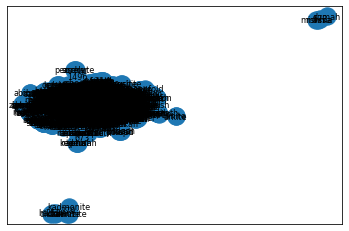

In [64]:
nx.draw_networkx(g_2_bible,font_size = 8)

According to the above figure, we can see that the whole corpus is divided into four subgroups.Therefore, we can deduce that words in each group is only 'socially' related to words in the same group.Now let's take a look at the subgroups.

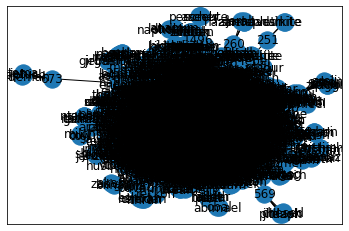

In [65]:
group_1 = list(nx.connected_components(g_2_bible))[0]
group_2 = list(nx.connected_components(g_2_bible))[1]
group_3 = list(nx.connected_components(g_2_bible))[2]
group_4 = list(nx.connected_components(g_2_bible))[3]
nx.draw_networkx(nx.subgraph(g_2_bible, group_1))

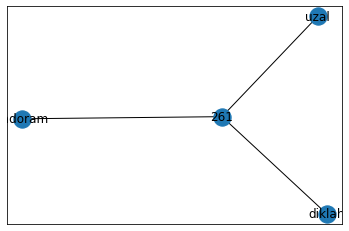

In [66]:
nx.draw_networkx(nx.subgraph(g_2_bible, group_2))

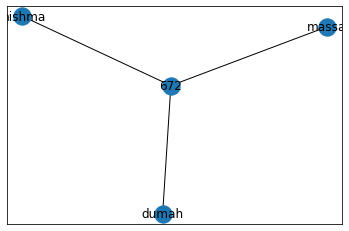

In [67]:
nx.draw_networkx(nx.subgraph(g_2_bible, group_3))

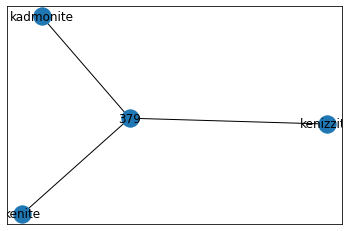

In [68]:
nx.draw_networkx(nx.subgraph(g_2_bible, group_4))

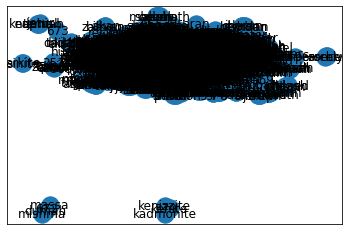

In [69]:
nx.draw_networkx(nx.restricted_view(g_2_bible,group_2,edges = [('alive', 1318)]))

Now let's try use doc and word  respectively as target type.

In [70]:
def contractNetwork_all(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [71]:
g_doc_bible = contractNetwork_all(g_2_bible, 'doc')
print(nx.info(g_doc_bible))

Name: 
Type: Graph
Number of nodes: 1533
Number of edges: 439871
Average degree: 573.8695


In [72]:
g_word_bible = contractNetwork_all(g_2_bible, 'word')
print(nx.info(g_word_bible))

Name: 
Type: Graph
Number of nodes: 1806
Number of edges: 36978
Average degree:  40.9502


There are some very interesting phenomena when we turn the target type from doc into word.
1. The number of nodes does not increase very much, which means that the docs may not be very long.
2. The number of edges and average degree decreas a lot. We can deduce that the different stories/docs in the selected Bible part are highly correlated to each other.

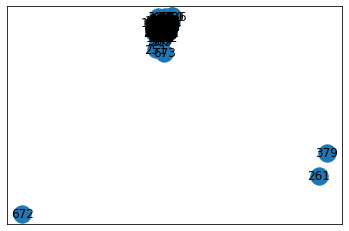

In [73]:
nx.draw_networkx(g_doc_bible)

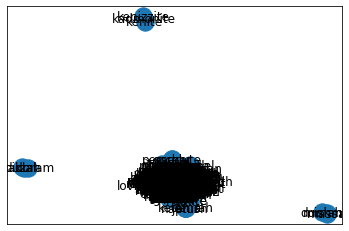

In [74]:
nx.draw_networkx(g_word_bible)

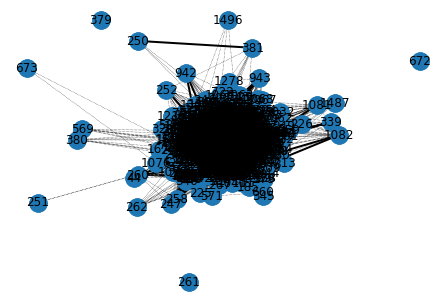

In [75]:
layout = nx.spring_layout(g_doc_bible, k = 1/3, weight='weight', iterations= 50)
wMedian = np.median([d['weight'] for n1, n2, d in g_doc_bible.edges(data = True)])
edgesHigh = [(n1, n2) for n1, n2, d in g_doc_bible.edges(data = True) if d['weight'] > wMedian]
edgesLow = [(n1, n2) for n1, n2, d in g_doc_bible.edges(data = True) if d['weight'] <= wMedian]
nx.draw(g_doc_bible, pos = layout, labels = {n:n for n in g_doc_bible.nodes()}, edgelist = edgesLow, style='dotted', width=.5)
nx.draw(g_doc_bible, pos = layout, nodelist=None, edgelist = edgesHigh, width=2)

In [76]:
g_doc_bible.edges

EdgeView([(0, 105), (0, 138), (0, 225), (0, 242), (0, 244), (0, 272), (0, 321), (0, 1216), (0, 1249), (0, 1336), (0, 1476), (0, 20), (0, 26), (0, 33), (0, 34), (0, 106), (0, 107), (0, 144), (0, 1), (0, 9), (0, 10), (0, 11), (0, 14), (0, 16), (0, 19), (0, 21), (0, 23), (0, 24), (0, 25), (0, 27), (0, 28), (0, 29), (0, 31), (0, 35), (0, 36), (0, 91), (0, 93), (0, 141), (0, 142), (0, 143), (0, 148), (0, 149), (0, 150), (0, 154), (0, 162), (0, 163), (0, 165), (0, 169), (0, 171), (0, 173), (0, 176), (0, 177), (0, 178), (0, 180), (0, 182), (0, 183), (0, 184), (0, 186), (0, 190), (0, 192), (0, 194), (0, 196), (0, 197), (0, 200), (0, 202), (0, 205), (0, 206), (0, 207), (0, 212), (0, 215), (0, 216), (0, 218), (0, 219), (0, 221), (0, 222), (0, 224), (0, 259), (0, 266), (0, 267), (0, 270), (0, 274), (0, 275), (0, 301), (0, 334), (0, 355), (0, 358), (0, 426), (0, 442), (0, 449), (0, 458), (0, 480), (0, 488), (0, 565), (0, 594), (0, 643), (0, 696), (0, 707), (0, 755), (0, 766), (0, 785), (0, 787), (

From the plots above, we can see that doc 672, 261 and 379 are seperated from the "united group", so does the words included in these docs. In addition, we also find that doc 1496, 251 and 673 are pretty outside the group.By observing the edges of the g_doc_bible graph (because the plot is very crowded), we can see that doc 0 has a lot of connections and it enjoys high weights with other docs.(Also doc 0 does not appear on the surrounding locations in the plot.) Therefore, we will use doc 0 as the 'popular' sample, doc 251 as the 'plain' sample and doc 672 as the 'cold' sample to see the texts and discuss.

In [77]:
print(len(bible.iloc[0]['text']),"words:","\n",bible.iloc[0]['text'].strip().replace('  ', '\n'))

55 words: 
 In the beginning God created the heavens and the earth.


In [78]:
print(len(bible.iloc[251]['text']),"words:","\n",bible.iloc[251]['text'].strip().replace('  ', '\n'))

47 words: 
 and the Hivite, and the Arkite, and the Sinite,


In [79]:
print(len(bible.iloc[672]['text']),"words:","\n",bible.iloc[672]['text'].strip().replace('  ', '\n'))

33 words: 
 and Mishma, and Dumah, and Massa,


I myself have very basic understanding of Bible, but I know 'God', 'the heavens' and 'the earth' are very important concepts in Bible, and it is not hard to understand that this doc enjoys popularity!

I think the Hivite, and the Arkite, and the Sinite are not highly associated with other stories in Bible and Mishma, and Dumah, and Massa have less. Only in terms of the Bible texts, maybe they are not very key figures in Bible. Thus their popularity decreases.

Now let's go back to g_word_bible.At first let's try to reduce the number of words.

In [80]:
wMean_bible = np.mean([d['weight'] for n1, n2, d in g_word_bible.edges(data = True)])
wMean_bible

1.9139217913353885

In [81]:
g_bible = wordCooccurrence(bible['normalized_sents'].sum())
print(len(g_bible))

1806


In [82]:
g_bible.remove_edges_from([(n1, n2) for n1, n2, d in g_bible.edges(data = True) if d['weight'] <= 20])
g_bible.remove_nodes_from(list(nx.isolates(g_bible)))
giant_bible = max(connected_component_subgraphs(g_bible), key=len)
print(nx.info(giant_bible))

Name: 
Type: Graph
Number of nodes: 70
Number of edges: 262
Average degree:   7.4857


We see that with these steps, only very "essential" nodes are kept.

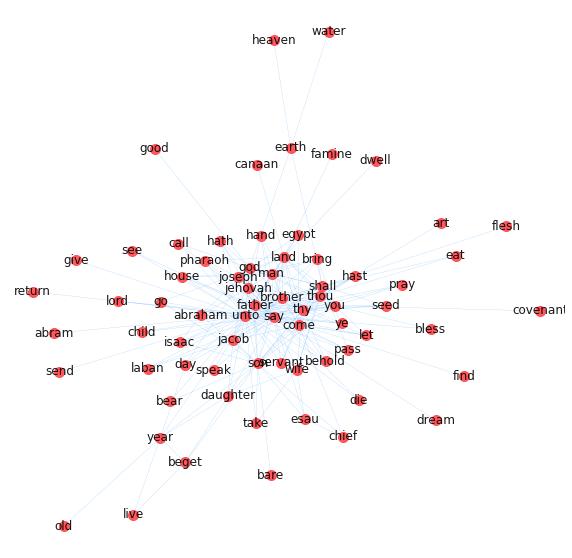

In [83]:
layout = nx.spring_layout(giant_bible, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_bible, ax = ax, pos = layout, labels = {n:n for n in giant_bible.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue')

Yeah! We can see that 'earth', 'heaven' and 'god' are all shown in the plot, which complies with our previous prediction that these are key concepts in Bible. This means that droping all the edges with weight below 20 helps us pick important words from Bible successfully!

In [84]:
c_bible = list(greedy_modularity_communities(giant_bible))
c_bible

[frozenset({'abraham',
            'abram',
            'art',
            'bare',
            'bear',
            'beget',
            'behold',
            'bless',
            'bring',
            'brother',
            'call',
            'canaan',
            'chief',
            'child',
            'come',
            'covenant',
            'daughter',
            'day',
            'die',
            'dream',
            'dwell',
            'earth',
            'eat',
            'egypt',
            'esau',
            'famine',
            'father',
            'find',
            'flesh',
            'give',
            'go',
            'god',
            'good',
            'hand',
            'hast',
            'hath',
            'heaven',
            'house',
            'isaac',
            'jacob',
            'jehovah',
            'joseph',
            'laban',
            'land',
            'let',
            'live',
            'lord',
            'man',
     

Now let's try to remove some "essential" words from the original documents.

In [85]:
giant_bible = nx.Graph(giant_bible)
giant_bible.remove_nodes_from([n for n in giant_bible.nodes if len(set(giant_bible.neighbors(n))) >= 50]) 
giant_bible.remove_nodes_from(list(nx.isolates(giant_bible)))
print(nx.info(giant_bible))

Name: 
Type: Graph
Number of nodes: 65
Number of edges: 212
Average degree:   6.5231


Here we see that most of the popoluar words (65/70) only appear in other documents less than 50. I think except for the names of a person or a place, one possible reason is that there are many different names for some important nouns in the Bible. For example, in the Bible Advocate, Almighty, Alpha, Amen, Angel of the Lord, Anointed One, etc. all refer to as God.

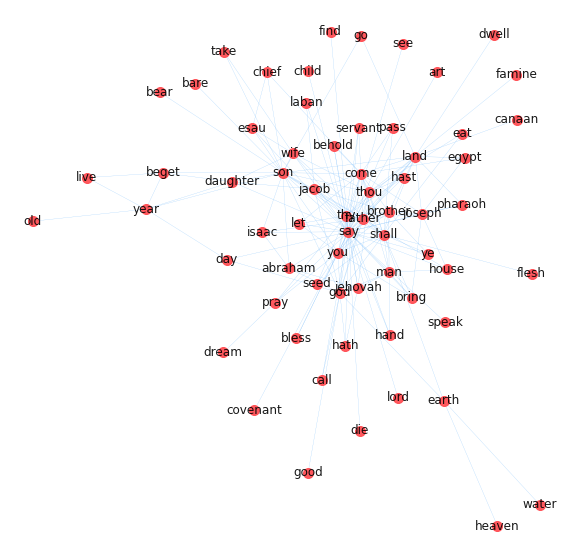

In [86]:
layout = nx.spring_layout(giant_bible, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_bible, ax = ax, pos = layout, labels = {n:n for n in giant_bible.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue')

In [87]:
print(', '.join(max(nx.clique.find_cliques(giant_bible), key = lambda x: len(x))))

say, thy, come, you, shall, father, land, son, thou


I have read some stories in the Bible, and I also know that there are many father stories in the Bible, including successful fathers and failed fathers. Now let's explore the networks with "father".

In [88]:
fatherNeighbors = giant_bible.neighbors('father')
g_father = giant_bible.subgraph(fatherNeighbors)
print(nx.info(g_father))

Name: 
Type: Graph
Number of nodes: 15
Number of edges: 82
Average degree:  10.9333


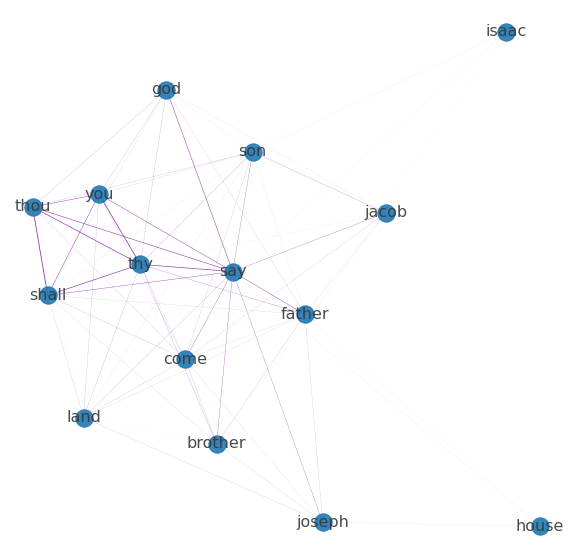

In [89]:
layout_father = nx.spring_layout(g_father, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
maxWeight = max((d['weight'] for n1, n2, d in g_father.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_father.edges(data = True)))
nx.draw(g_father, ax = ax, pos = layout_father, labels = {n:n for n in g_father.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_father.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:purple',
        cmap = plt.get_cmap('plasma'))

In [90]:
fatherNeighbors = g_word_bible.neighbors('father')
fatherNeighborsPlus1 = set(fatherNeighbors)
for n in fatherNeighbors:
    fatherNeighborsPlus1 |= set(giant_bible.neighbors(n))
    
for x in fatherNeighborsPlus1:
    print(x)

lie
dew
bear
portion
widow
assemble
beforetime
answer
help
lord
love
mamre
knowest
fear
delight
mount
forget
suffer
choice
rebekah
shear
grave
jehovah
prosper
sojourn
blessing
hand
paddan
spicery
pit
meet
guile
remove
wine
oni
bondman
moabites
edom
nation
wander
rebuke
saith
lamentation
forgive
jabal
wherefore
labor
goeth
charge
room
sorrow
praise
manner
anah
thy
kindness
year
water
accord
seeth
egypt
death
tribe
zilpah
abraham
voice
far
iram
child
hearken
spread
manasseh
simeon
egyptians
hebron
jubal
forth
alive
change
almighty
staff
hurt
wentest
bethuel
life
ephron
soon
progenitor
mother
way
flock
hast
judge
liest
fall
soul
remain
generation
brother
send
great
pharaoh
edomites
yesternight
fruit
rich
face
sake
boil
flesh
set
prevail
sarai
wood
feel
heart
nakedness
name
bind
haste
inheritance
sore
benjamin
till
earth
shepherd
cave
lest
uz
woman
see
o
midst
speak
signet
carry
dead
fat
one
myrrh
come
kid
herd
kindred
take
kiriath
sleep
pre
bless
arba
son
little
`
you
digged
coucheth
end


In [91]:
g_father2 = giant_bible.subgraph(fatherNeighborsPlus1)
print(nx.info(g_father2))

Name: 
Type: Graph
Number of nodes: 62
Number of edges: 191
Average degree:   6.1613


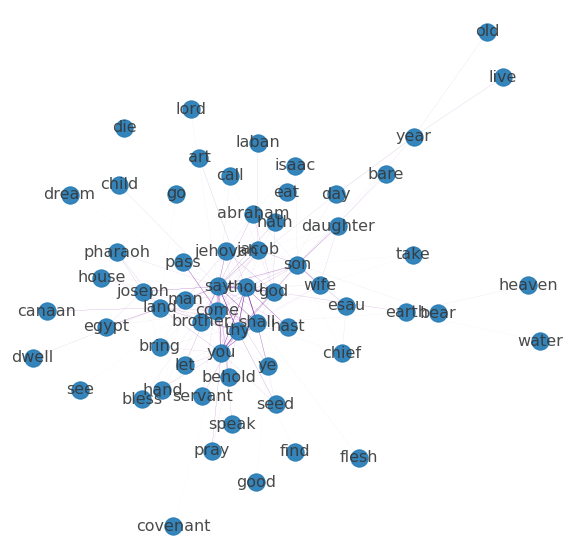

In [92]:
layout_father = nx.spring_layout(g_father2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_father = nx.eigenvector_centrality(g_father2)
maxC = max(centralities_father.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in g_father2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_father2.edges(data = True)))
nx.draw(g_father2, ax = ax, pos = layout_father, labels = {n:n for n in g_father2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_father2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:purple',
        cmap = plt.get_cmap('plasma'))

# Network Statistics
We can often gain more insight into our semantic network through statistics that describe the positions of words within it.

We begin with measures of centrality. The concept of centrality is that some nodes (words or documents) are more *central* to the network than others. The most straightforward is the notion of degree centrality: those nodes that have the highest number of connections are the most central. Here our measure normalizes the number of connections by those with the most connections.

In [93]:
dcentralities = nx.degree_centrality(giant)

In [94]:
dcentralities['american']

0.038216560509554146

In [95]:
max(dcentralities.items(), key = lambda x : x[1])

('health', 0.43312101910828027)

We can color and size the nodes by betweenness centrality, it's much faster to redraw since we aren't redoing the layout.

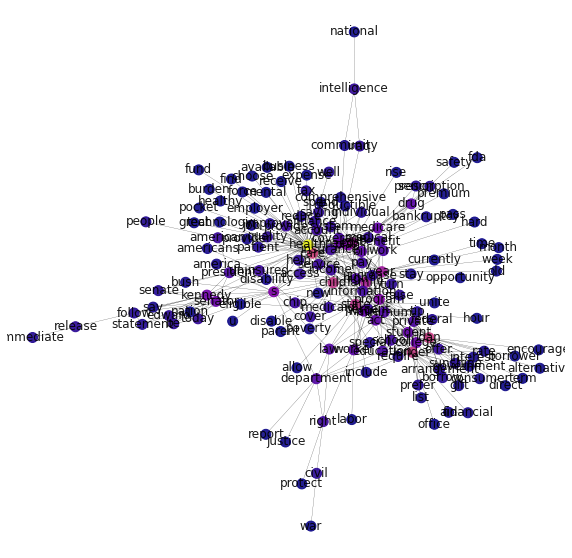

In [96]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

Another way to visualize the graph involes the use of size to represent degree centrality and edge weight:

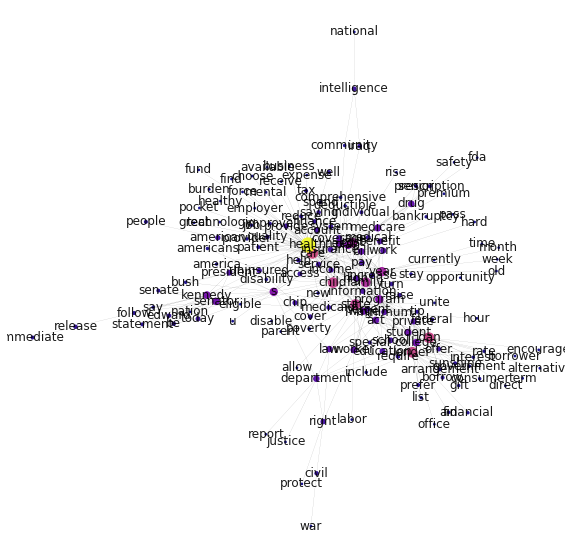

In [97]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord.edges(data = True)], 
        alpha = .9, 
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        node_size = [dcentralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

The distrubution of degree centrality is:

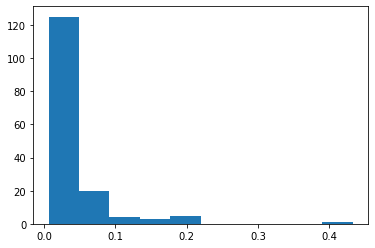

In [98]:
plt.hist(list(dcentralities.values()))
plt.show()

What are the top and bottom ten words in terms of degree?

In [99]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.43312101910828027),
 ('care', 0.21656050955414013),
 ('lender', 0.20382165605095542),
 ('loan', 0.20382165605095542),
 ('child', 0.19745222929936307),
 ('state', 0.1910828025477707),
 ('family', 0.1656050955414013),
 ('cost', 0.15923566878980894),
 ('year', 0.15286624203821658),
 ('program', 0.11464968152866242)]

In [100]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('national', 0.006369426751592357),
 ('report', 0.006369426751592357),
 ('encourage', 0.006369426751592357),
 ('eligible', 0.006369426751592357),
 ('justice', 0.006369426751592357),
 ('find', 0.006369426751592357),
 ('pass', 0.006369426751592357),
 ('time', 0.006369426751592357),
 ('disable', 0.006369426751592357),
 ('term', 0.006369426751592357)]

Consider another very different measure, which is *betweenness* centrality. Betweenness centrality distinguishes nodes that require the most shortest pathways between all other nodes in the network. Semantically, words with a high betweenness centrality may link distinctive domains, rather than being "central" to any one. In other words, high *betweenness centrality* nodes may not have the highest *degree centrality*.

In [101]:
centralities = nx.betweenness.betweenness_centrality(giant)

In [102]:
centralities['american']

0.012738853503184714

In [103]:
max(centralities.items(), key = lambda x : x[1])

('health', 0.42036210248253647)

We can color and size the nodes by betweenness centrality:

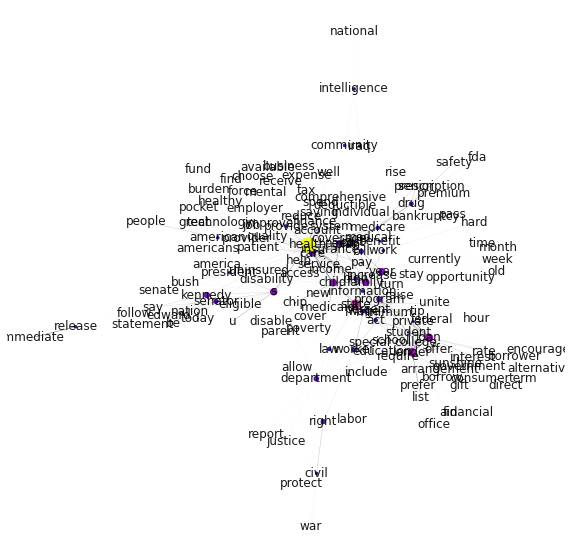

In [104]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

The distrubution of betweenness centrality is:

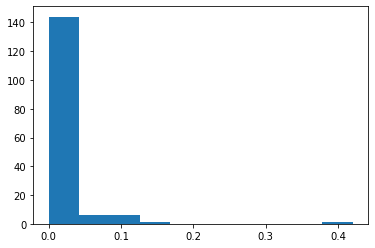

In [105]:
plt.hist(list(centralities.values()))
plt.show()

This is an exponential distrubution, but you might need to add more nodes to see it clearly.

What are the top ten words in terms of betweenness?

In [106]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.43312101910828027),
 ('care', 0.21656050955414013),
 ('lender', 0.20382165605095542),
 ('loan', 0.20382165605095542),
 ('child', 0.19745222929936307),
 ('state', 0.1910828025477707),
 ('family', 0.1656050955414013),
 ('cost', 0.15923566878980894),
 ('year', 0.15286624203821658),
 ('program', 0.11464968152866242)]

What are words lower down?

In [107]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[50:60]

[('system', 0.03184713375796178),
 ('today', 0.03184713375796178),
 ('access', 0.03184713375796178),
 ('cover', 0.03184713375796178),
 ('offer', 0.03184713375796178),
 ('iraq', 0.025477707006369428),
 ('require', 0.025477707006369428),
 ('be', 0.025477707006369428),
 ('help', 0.025477707006369428),
 ('release', 0.025477707006369428)]

We can also look at closeness centrality, or the average Euclidean or path distance between a node and all others in the network. A node with the highest closeness centrality is most likely to send a signal with the most coverage to the rest of the network.

In [108]:
centralities = nx.closeness_centrality(giant)

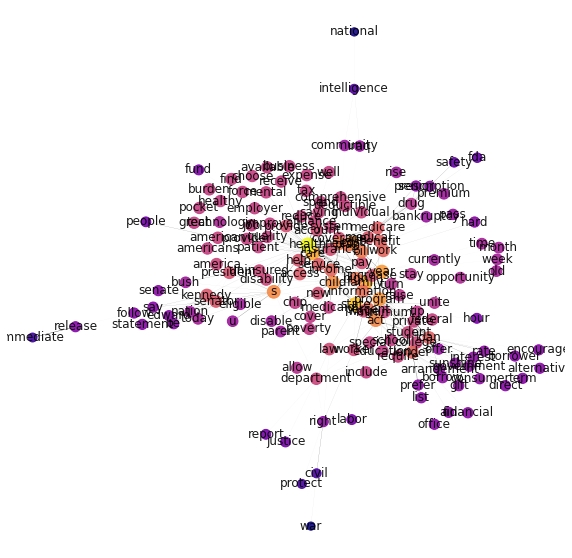

In [109]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

Top and bottom:

In [110]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.5508771929824562),
 ('state', 0.5048231511254019),
 ('family', 0.4845679012345679),
 ('care', 0.4801223241590214),
 ('year', 0.4658753709198813),
 ('program', 0.46176470588235297),
 ('child', 0.4563953488372093),
 ('cost', 0.4511494252873563),
 ('s', 0.44857142857142857),
 ('act', 0.4472934472934473)]

In [111]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('justice', 0.26837606837606837),
 ('people', 0.26610169491525426),
 ('fda', 0.25363489499192243),
 ('safety', 0.25363489499192243),
 ('intelligence', 0.2353823088455772),
 ('civil', 0.22753623188405797),
 ('protect', 0.22687861271676302),
 ('immediate', 0.22081575246132207),
 ('national', 0.19076549210206561),
 ('war', 0.18557919621749408)]

Or eignvector centrality, an approach that weights degree by the centrality of those to whom one is tied (and the degree to whom they are tied, etc.) In short, its an $n$th order degree measure.

In [112]:
centralities = nx.eigenvector_centrality(giant)

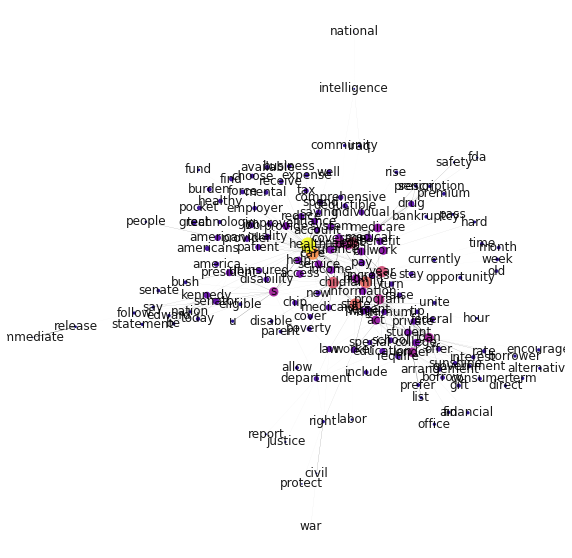

In [113]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

Note how the colors reveal a much more graduate distribution here. Let's look at it directly.

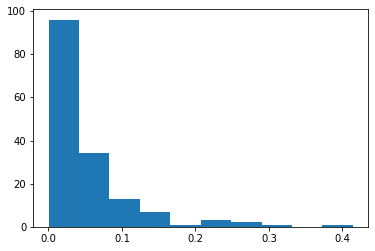

In [114]:
plt.hist(list(centralities.values()))
plt.show()

Top and bottom:

In [115]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.41421797822651274),
 ('care', 0.2977697413193447),
 ('family', 0.25029511119498954),
 ('state', 0.24969793403288465),
 ('child', 0.22995111817868855),
 ('cost', 0.21729639645054508),
 ('year', 0.21491308448333518),
 ('program', 0.17137587976970214),
 ('need', 0.1606204848201531),
 ('plan', 0.15339424720008993)]

In [116]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('fda', 0.0037606774496355046),
 ('safety', 0.0037606774496355046),
 ('report', 0.0025365344959165244),
 ('justice', 0.0025365344959165244),
 ('intelligence', 0.0017995098835093789),
 ('civil', 0.0008701062371919275),
 ('protect', 0.0008046732394885576),
 ('immediate', 0.0003896083825432904),
 ('national', 0.00012643460042104814),
 ('war', 6.113716692984287e-05)]

We can now filter our network by a centrality measure. Let's define a function and experiment with it:

In [117]:
def filterWords(G, minWeight = 3, filter_ = "betweenness", rule = "number", value_of_rule = 200):
    """Function to filter network by degree centrality measures"""
    G = G.copy()
    try:
        G.remove_edges_from([(n1,n2) for n1, n2, d in G.edges(data = True) if d['weight'] < minWeight])
    except:
        print("weight might be missing from one or more edges")
        raise
    if filter_ =="betweenness":
        index = nx.betweenness_centrality(G) #betweeness centrality score
    elif filter_ == "closeness":
        index = nx.closeness_centrality(G) #closeness centrality score
    elif filter_ == "eigenvector":
        index = nx.eigenvector_centrality(G) #eigenvector centrality score
    elif filter_ == "degree":
        index = nx.degree_centrality(G) #degree centrality score
    else:
        raise ValueError("wrong filter paremeter, should be: betweenness/closeness/eigenvector")    
        
    if rule=='number':# if filter by limiting the total number of nodes 
        
        sorted_index = sorted(index.items(), key=lambda x:x[1], reverse=True)
        value_of_rule = np.min([value_of_rule, len(G.nodes)])
        
        nodes_remain = {}
        for word, centr in sorted_index[:value_of_rule]:
            nodes_remain[word] = centr
        G.remove_nodes_from([n for n in index if n not in nodes_remain])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='above':# if filter by limiting the min value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] >=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='below':# if filter by limiting the max value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] <=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G

In [118]:
giant_filtered30 = filterWords(giant, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
print(nx.info(giant_filtered30))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 122
Average degree:   9.7600


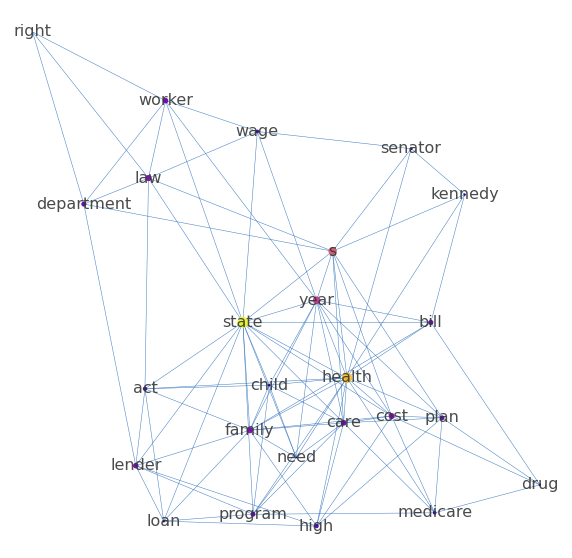

In [119]:
layout_giant_filtered30 = nx.spring_layout(giant_filtered30, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_giant30 = nx.betweenness_centrality(giant_filtered30)
maxC = max(centralities_giant30.items(), key = lambda x : x[1])[1]
nx.draw(giant_filtered30, ax = ax, pos = layout_giant_filtered30, labels = {n: n for n in giant_filtered30.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_giant30[n] / maxC for n in giant_filtered30.nodes],
        node_size = [centralities_giant30[n] / maxC * 100 for n in giant_filtered30.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

We can also look at global statistics, like the density of a network, defined as the number of actual edges divided by the total number of possible edges:

In [120]:
nx.density(giant)

0.03692655002821898

We can also calculate the average degree per node:

In [121]:
np.mean([v for w,v in nx.degree(giant)])

5.7974683544303796

The diameter calculates the average distance between any two nodes in the network:

In [122]:
nx.diameter(giant)

8

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">Construct cells immediately below this that calculate different kinds of centrality for distinct words or documents in a network composed from your corpus of interest. Which type of words tend to be most and least central? Can you identify how different centrality measures distinguish different kind of words in your corpus? What do these patterns suggest about the semantic content and structure of your documents? Finally, calculate global measure for your network(s) and discuss what they reveal.

### Normalizing the number of connections by those with the most connections.

In [123]:
dcentralities = nx.degree_centrality(giant_bible)
dcentralities['father']

0.25

In [124]:
max(dcentralities.items(), key = lambda x : x[1])

('say', 0.671875)

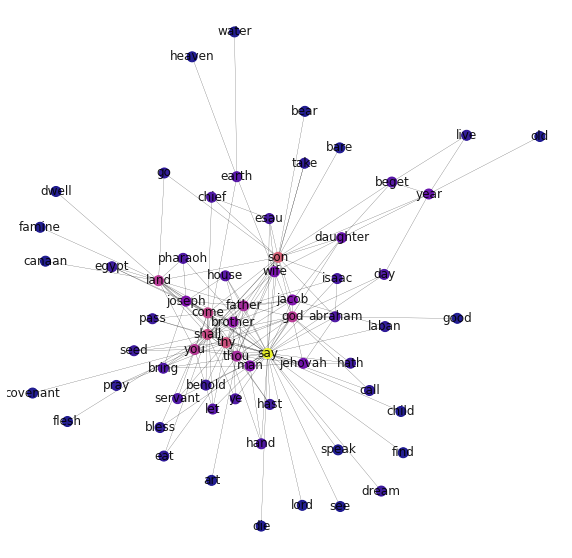

In [125]:
layout = nx.spring_layout(giant_bible, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
nx.draw(giant_bible, ax = ax, pos = layout, labels = {n:n for n in giant_bible.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities[n] / maxC for n in giant_bible.nodes],
        cmap = plt.get_cmap('plasma'))

### We can also draw the graph involving the use of size to represent degree centrality and edge weight.

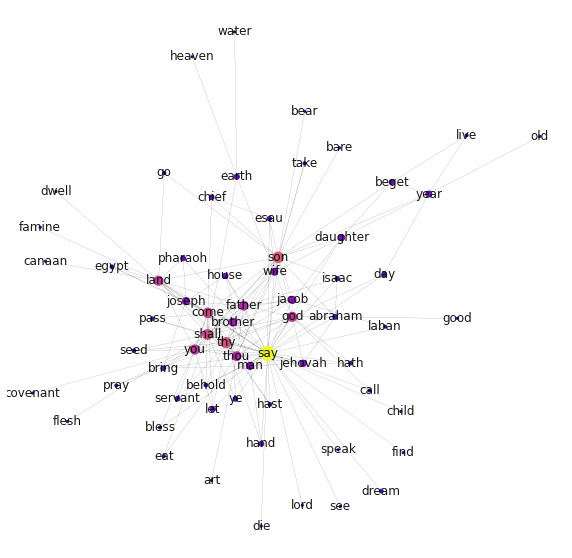

In [126]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
nx.draw(giant_bible, ax = ax, pos = layout, labels = {n:n for n in giant_bible.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_word_bible.edges(data = True)], 
        alpha = .9, 
        node_color = [dcentralities[n] / maxC for n in giant_bible.nodes],
        node_size = [dcentralities[n] / maxC * 200 for n in giant_bible.nodes],
        cmap = plt.get_cmap('plasma'))

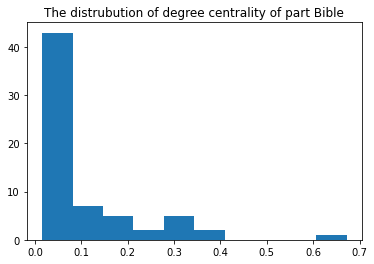

In [127]:
plt.hist(list(dcentralities.values()))
plt.title('The distrubution of degree centrality of part Bible')
plt.show()

In [128]:
print('Top 10 words in terms of degree: ')
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

Top 10 words in terms of degree: 


[('say', 0.671875),
 ('son', 0.375),
 ('thy', 0.34375),
 ('shall', 0.328125),
 ('come', 0.3125),
 ('you', 0.28125),
 ('land', 0.28125),
 ('god', 0.28125),
 ('thou', 0.25),
 ('father', 0.25)]

In [129]:
print('Bottom 10 words in terms of degree: ')
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[-10:]

Bottom 10 words in terms of degree: 


[('lord', 0.015625),
 ('water', 0.015625),
 ('see', 0.015625),
 ('dwell', 0.015625),
 ('die', 0.015625),
 ('bare', 0.015625),
 ('canaan', 0.015625),
 ('find', 0.015625),
 ('heaven', 0.015625),
 ('old', 0.015625)]

### Betweenness centrality

In [130]:
centralities = nx.betweenness.betweenness_centrality(giant_bible)
centralities['father']

0.015439979086687768

In [131]:
max(centralities.items(), key = lambda x : x[1])

('say', 0.44253751366190086)

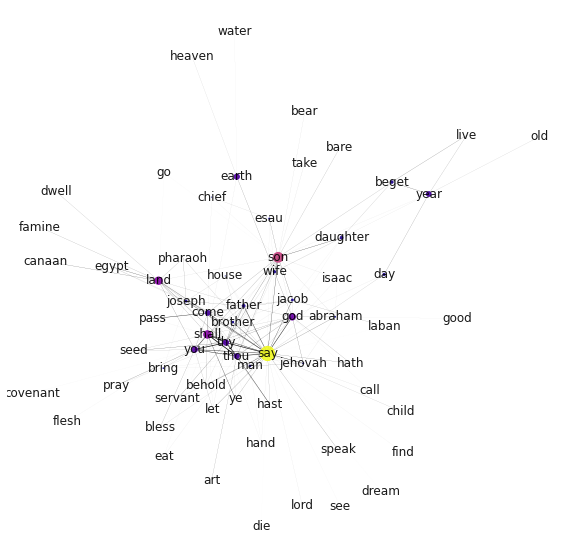

In [132]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
nx.draw(giant_bible, ax = ax, pos = layout, labels = {n:n for n in giant_bible.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant_bible.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant_bible.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant_bible.nodes],
        cmap = plt.get_cmap('plasma'))

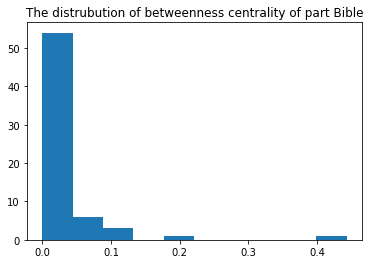

In [133]:
plt.hist(list(centralities.values()))
plt.title('The distrubution of betweenness centrality of part Bible')
plt.show()

In [134]:
print('Top 10 words in terms of betweenness centrality: ')
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

Top 10 words in terms of betweenness centrality: 


[('say', 0.44253751366190086),
 ('son', 0.21072973956158475),
 ('shall', 0.1228526101906704),
 ('land', 0.12100454238934627),
 ('god', 0.08995503917378916),
 ('you', 0.06697520799630392),
 ('earth', 0.06200396825396825),
 ('thy', 0.06186223971588116),
 ('thou', 0.0531028082367368),
 ('year', 0.04952544148972718)]

We can see that 'say' and 'son' connect others in the broader network, and they are also top words in terms of degree centrality.

In [135]:
print('Bottom 10 words in terms of betweenness centrality: ')
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

Bottom 10 words in terms of betweenness centrality: 


[('go', 0.0),
 ('canaan', 0.0),
 ('find', 0.0),
 ('heaven', 0.0),
 ('old', 0.0),
 ('seed', 0.0),
 ('let', 0.0),
 ('pass', 0.0),
 ('servant', 0.0),
 ('ye', 0.0)]

### Closeness centrality

In [136]:
centralities = nx.closeness_centrality(giant_bible)

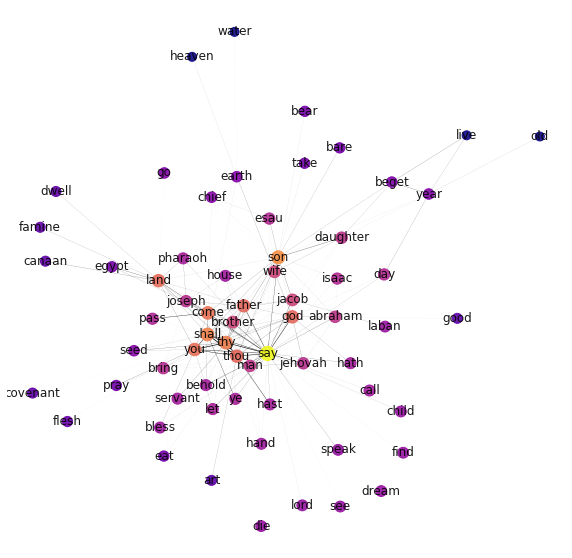

In [137]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
nx.draw(giant_bible, ax = ax, pos = layout, labels = {n:n for n in giant_bible.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant_bible.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant_bible.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant_bible.nodes],
        cmap = plt.get_cmap('plasma'))

In [138]:
print('Top 10 words in terms of closeness centrality')
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

Top 10 words in terms of closeness centrality


[('say', 0.7032967032967034),
 ('son', 0.5925925925925926),
 ('shall', 0.5765765765765766),
 ('thy', 0.5714285714285714),
 ('come', 0.5565217391304348),
 ('you', 0.5517241379310345),
 ('land', 0.5470085470085471),
 ('thou', 0.5423728813559322),
 ('father', 0.5423728813559322),
 ('god', 0.5423728813559322)]

In [139]:
print('Bottom 10 words in terms of closeness centrality')
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

Bottom 10 words in terms of closeness centrality


[('covenant', 0.3575418994413408),
 ('famine', 0.35555555555555557),
 ('dwell', 0.35555555555555557),
 ('canaan', 0.35555555555555557),
 ('art', 0.35359116022099446),
 ('good', 0.35359116022099446),
 ('live', 0.28444444444444444),
 ('water', 0.28444444444444444),
 ('heaven', 0.28444444444444444),
 ('old', 0.2831858407079646)]

### Eignvector centrality

In [140]:
centralities = nx.eigenvector_centrality(giant_bible)

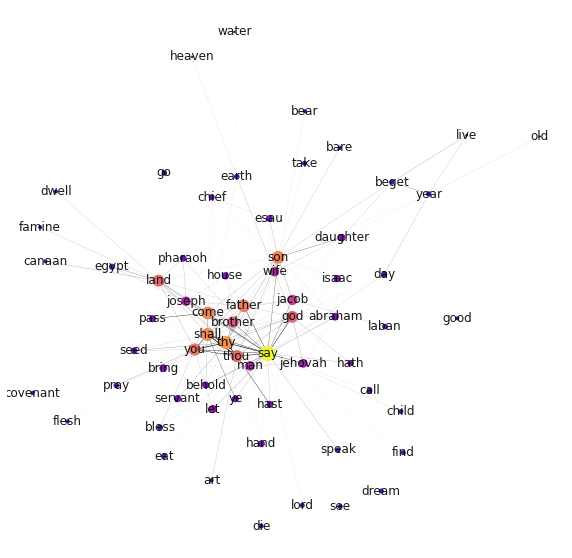

In [141]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_bible.edges(data = True)))
nx.draw(giant_bible, ax = ax, pos = layout, labels = {n:n for n in giant_bible.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant_bible.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant_bible.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant_bible.nodes],
        cmap = plt.get_cmap('plasma'))

Also we can see how the colors reveal a much more graduate distribution here.

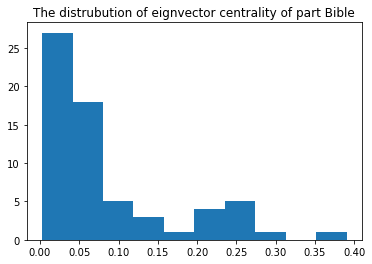

In [142]:
plt.hist(list(centralities.values()))
plt.title('The distrubution of eignvector centrality of part Bible')
plt.show()

In [143]:
print('Top 10 words in terms of eignvector centrality')
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

Top 10 words in terms of eignvector centrality


[('say', 0.39003570803295945),
 ('thy', 0.2897744860412732),
 ('shall', 0.2715635269210828),
 ('come', 0.2691734026718759),
 ('son', 0.2688276966155285),
 ('father', 0.25489330809333144),
 ('you', 0.2476860534473649),
 ('thou', 0.2334813683303575),
 ('land', 0.22886215145201597),
 ('god', 0.2217182969777483)]

In [144]:
print('Bottom 10 words in terms of eignvector centrality')
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

Bottom 10 words in terms of eignvector centrality


[('covenant', 0.01893211083895555),
 ('art', 0.017846433388395637),
 ('famine', 0.017493254416015083),
 ('dwell', 0.017493254416015083),
 ('canaan', 0.017493254416015083),
 ('good', 0.016947382546720905),
 ('live', 0.00535028196856951),
 ('water', 0.003160507974550455),
 ('heaven', 0.003160507974550455),
 ('old', 0.0028403403249382168)]

### With these centrality measurements, we can filter our network by a centrality measure.

In [145]:
giant_filtered_bible = filterWords(giant_bible, minWeight=3, filter_='betweenness', rule='number', value_of_rule=20)
print(nx.info(giant_filtered_bible))

Total number of nodes(after filtering) in the graph is 20
Name: 
Type: Graph
Number of nodes: 20
Number of edges: 106
Average degree:  10.6000


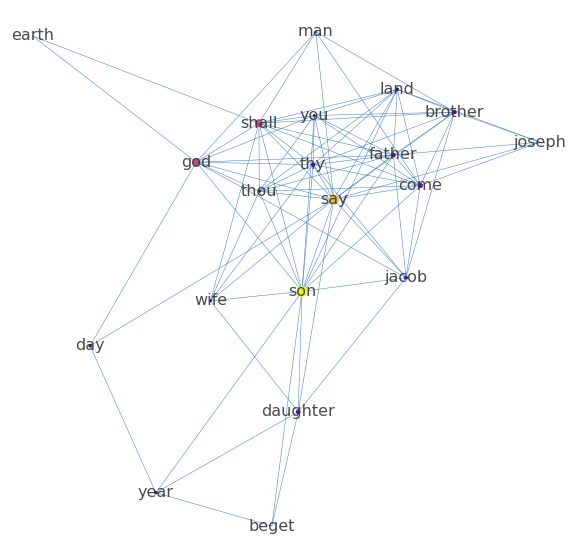

In [146]:
layout_giant_filtered_bible = nx.spring_layout(giant_filtered_bible, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_giant_bible = nx.betweenness_centrality(giant_filtered_bible)
maxC = max(centralities_giant_bible.items(), key = lambda x : x[1])[1]
nx.draw(giant_filtered_bible, ax = ax, pos = layout_giant_filtered_bible, labels = {n: n for n in giant_filtered_bible.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_giant_bible[n] / maxC for n in giant_filtered_bible.nodes],
        node_size = [centralities_giant_bible[n] / maxC * 100 for n in giant_filtered_bible.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

### Global statistics

#### The density of a network

In [147]:
nx.density(giant_bible)

0.10192307692307692

#### The average degree per node

In [148]:
np.mean([v for w,v in nx.degree(giant_bible)])

6.523076923076923

#### The average distance between any two nodes in the network

In [149]:
nx.diameter(giant_bible)

5

# POS based networks

Now let's look at links between specific parts of speech within a network.



Let's look at nouns co-occurring in sentences using the top 10 (by score) reddit posts on thread topics we have explored in prior sessions:

In [150]:
redditDF = pandas.read_csv('../data/reddit.csv', index_col = 0)

In [151]:
redditTopScores = redditDF.sort_values('score')[-100:]
redditTopScores['sentences'] = redditTopScores['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
redditTopScores.index = range(len(redditTopScores) - 1, -1,-1) #Reindex to make things nice in the future
redditTopScores[:3]

,author,over_18,score,subreddit,text,title,url,sentences
99,jimmy_three_shoes,False,4990,Tales From Tech Support,"This happened a little while ago, when I was c...","We've tried nothing, and we're all out of ideas!",https://www.reddit.com/r/talesfromtechsupport/...,"[[This, happened, a, little, while, ago, when,..."
98,badbfriend,False,5034,Relationships,https://www.reddit.com/r/relationships/comment...,"Me [29 M] with my g/f [27 F] together 4 years,...",https://www.reddit.com/r/relationships/comment...,[[https://www.reddit.com/r/relationships/comme...
97,Fafrdr,False,5146,Relationships,First post: https://www.reddit.com/r/relations...,Update - My [16F] father [59M] acts creepy tow...,https://www.reddit.com/r/relationships/comment...,"[[First, post, https://www.reddit.com/r/relati..."


Now we'll normalize the tokens through stemming:

In [152]:
redditTopScores['normalized_sents'] = redditTopScores['sentences'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

We will revisit spacy and use it's english language model.

In [153]:
import spacy

In [154]:
nlp = spacy.load('en')

In [155]:
def posCooccurrence(sentences, *posType, makeMatrix = False):
    words = set()
    reducedSents = []
    #Only using the first kind of POS for each word
    wordsMap = {}
    for sent in sentences:
        s = [(w, t) for w, t in lucem_illud_2020.spacy_pos(sent) if t in posType]
        for w, t in s:
            if w not in wordsMap:
                wordsMap[w] = t
        reducedSent = [w for w, t in s]
        words |= set(reducedSent)
        reducedSents.append(reducedSent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in reducedSents:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        for w in g.nodes:
            g.nodes[w]['bipartite'] = wordsMap[w]
        return g

In [156]:
gNN = posCooccurrence(redditTopScores['normalized_sents'].sum(), 'NN')

In [157]:
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 1957
Number of edges: 11931
Average degree:  12.1932


This is a bit too large to effectively visualize, so let's remove the vertices with degree less than or equal to 100:

In [158]:
gNN.remove_nodes_from([n for n in gNN.nodes if len(set(gNN.neighbors(n))) <= 100]) 
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 27
Number of edges: 261
Average degree:  19.3333


And low weight edges:

In [159]:
gNN.remove_edges_from([(n1, n2) for n1, n2, d in gNN.edges(data = True) if d['weight'] <= 2])
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 27
Number of edges: 88
Average degree:   6.5185


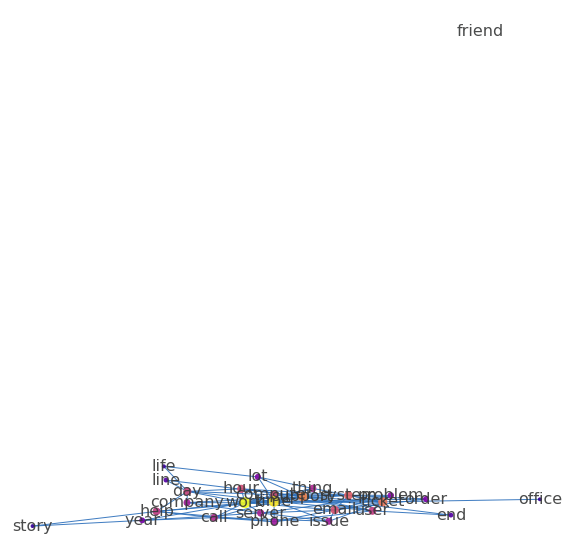

In [160]:
layout_nn = nx.spring_layout(gNN, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nn = nx.eigenvector_centrality(gNN)
maxC = max(centralities_nn.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNN.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNN.edges(data = True)))
nx.draw(gNN, ax = ax, pos = layout_nn, labels = {n: n for n in gNN.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nn[n] / maxC for n in gNN.nodes],
        node_size = [centralities_nn[n] / maxC * 100 for n in gNN.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

This makes sense: people are talking about work, support, computers, time... it's a tech support forum, so these are expected connections.

What if we want to look at noun-verb pairs instead?

In [161]:
gNV = posCooccurrence(redditTopScores['normalized_sents'].sum(), 'NN', 'VB')

`gNV` has co-occurrences between nouns and nouns as well as between verbs and verbs. Let's remove these and make it purely about noun and verb combinations:

In [162]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2105
Number of edges: 18560
Average degree:  17.6342


In [163]:
gNV.remove_edges_from([(n1,n2) for n1,n2,d in gNV.edges(data = True) if gNV.nodes[n1]['bipartite'] == gNV.nodes[n2]['bipartite']])

In [164]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2105
Number of edges: 6078
Average degree:   5.7748


Dropping low weight edges and low degree vertices gives us:

In [165]:
gNV.remove_edges_from([(n1, n2) for n1, n2, d in gNV.edges(data = True) if d['weight'] <= 2])
gNV.remove_nodes_from([n for n in gNV.nodes if len(set(gNV.neighbors(n))) <= 5])

In [166]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 22
Number of edges: 66
Average degree:   6.0000


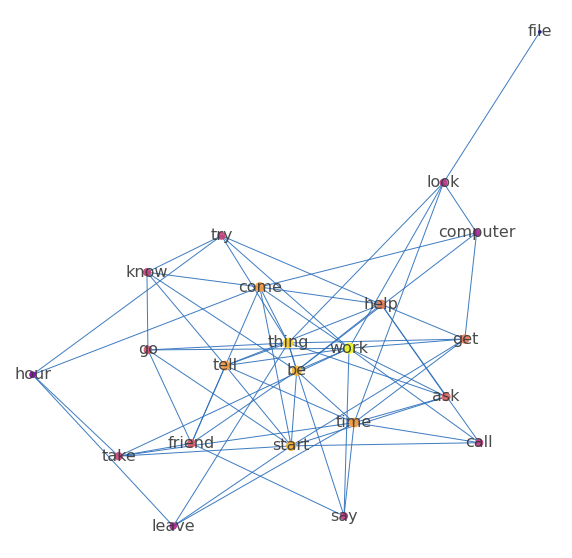

In [167]:
layout_nn = nx.spring_layout(gNV, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nv = nx.eigenvector_centrality(gNV)
maxC = max(centralities_nv.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV.edges(data = True)))
nx.draw(gNV, ax = ax, pos = layout_nn, labels = {n: n for n in gNV.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv[n] / maxC for n in gNV.nodes],
        node_size = [centralities_nv[n] / maxC * 100 for n in gNV.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       ) 

Lets create an "ego network" surrounding a single (important) word, as we did before:

In [168]:
g_i = gNV.subgraph(['work'] + list(gNV.neighbors('work')))

In [169]:
print(nx.info(g_i))

Name: 
Type: Graph
Number of nodes: 12
Number of edges: 11
Average degree:   1.8333


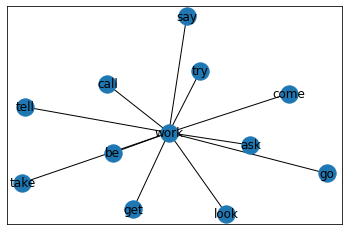

In [170]:
nx.draw_networkx(g_i)

Instead of just nodes connected to a vertex, we can find all those connected to it within 2 hops, lets look at 'look' (+ points for being meta) for this:

In [171]:
storyNeighbors = gNV.neighbors('look')
set(storyNeighbors)

{'computer', 'file', 'thing', 'time', 'work'}

In [172]:
storyNeighbors = set(gNV.neighbors('look'))
storyNeighborsPlus1 = set(storyNeighbors)
for n in storyNeighbors:
    storyNeighborsPlus1 |= set(gNV.neighbors(n))

In [173]:
gNV_story = gNV.subgraph(storyNeighborsPlus1)
print(nx.info(gNV_story))

Name: 
Type: Graph
Number of nodes: 17
Number of edges: 35
Average degree:   4.1176


This is a mid-sized network, but we can interrogate it intelligently by computing some statistics. Degree centrality:

In [174]:
sorted(nx.degree_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('work', 0.6875),
 ('thing', 0.625),
 ('time', 0.5625),
 ('look', 0.3125),
 ('computer', 0.25),
 ('get', 0.25),
 ('be', 0.25),
 ('come', 0.1875),
 ('say', 0.1875),
 ('tell', 0.1875)]

Or eigenvector centrality:

In [175]:
sorted(nx.eigenvector_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('work', 0.4243874885065112),
 ('thing', 0.39541360211647264),
 ('time', 0.35676114748136667),
 ('look', 0.26677486077190093),
 ('get', 0.2572337058302407),
 ('be', 0.2572337058302407),
 ('say', 0.22250581433600003),
 ('tell', 0.22250581433600003),
 ('ask', 0.22250581433600003),
 ('come', 0.18976474662612278)]

Lets plot it:

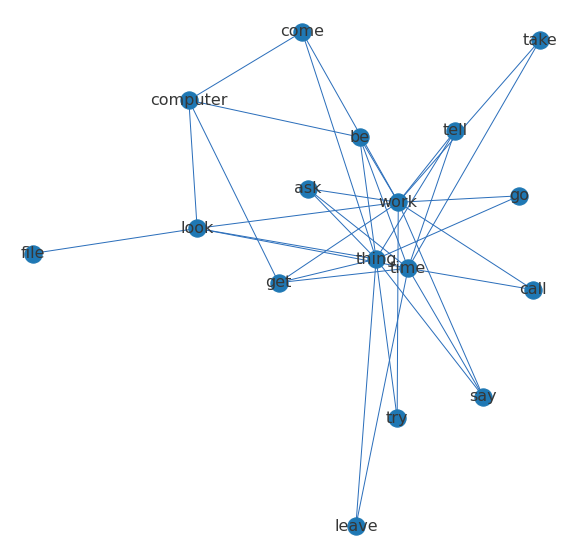

In [176]:
layout_story = nx.spring_layout(gNV_story, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNV_story, ax = ax, pos = layout_story, labels = {n: n for n in gNV_story.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       ) 

Lets create a noun-adjective network:

In [177]:
gNJ = posCooccurrence(redditTopScores['normalized_sents'][:100].sum(), 'NN', 'JJ')
print(nx.info(gNJ))

Name: 
Type: Graph
Number of nodes: 2582
Number of edges: 19723
Average degree:  15.2773


By filtering by a centrality measure we can get a more 'central' set of nodes instead of just the most connected.

In [178]:
gNJ_filtered200 = filterWords(gNJ, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
print(nx.info(gNJ_filtered200))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 76
Average degree:   6.0800


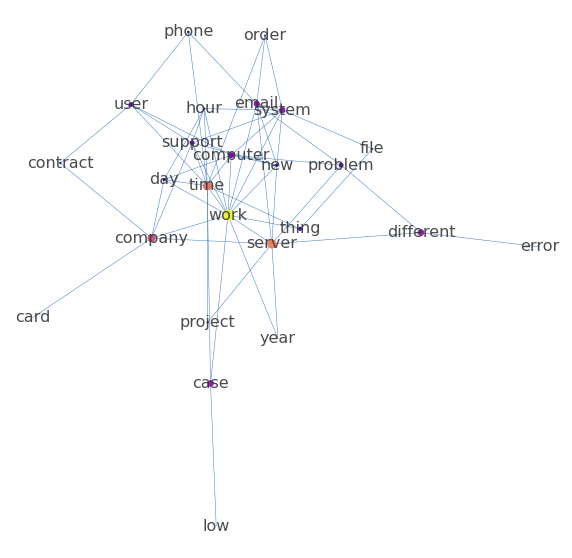

In [179]:
layout_NJ_filtered200 = nx.spring_layout(gNJ_filtered200, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj200 = nx.betweenness_centrality(gNJ_filtered200)
maxC = max(centralities_nj200.items(), key = lambda x : x[1])[1]
nx.draw(gNJ_filtered200, ax = ax, pos = layout_NJ_filtered200, labels = {n: n for n in gNJ_filtered200.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_nj200[n] / maxC for n in gNJ_filtered200.nodes],
        node_size = [centralities_nj200[n] / maxC * 100 for n in gNJ_filtered200.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that construct at least two different networks comprising different combinations of word types, linked by different syntactic structures, which illuminate your corpus and the dynamics you are interested to explore. Graph these networks or subnetworks within them. What are relationships that are meaningful? 

<span style="color:red">***Stretch***: Graph some word-centered "ego-networks" with words one link away, two links away, and three links away (we only did up to two links away above).

### nouns co-occurring

In [180]:
gNN_bible = posCooccurrence(bible['normalized_sents'].sum(), 'NN')

In [181]:
print(nx.info(gNN_bible))

Name: 
Type: Graph
Number of nodes: 653
Number of edges: 2736
Average degree:   8.3798


There are too many nodes, which will make the gragh hard to read. We need to cut down some nodes. We will remove the vertices with degree less than or equal to 20 and low weight edges.

In [182]:
gNN_bible.remove_nodes_from([n for n in gNN_bible.nodes if len(set(gNN_bible.neighbors(n))) <= 20]) 
print(nx.info(gNN_bible))

Name: 
Type: Graph
Number of nodes: 48
Number of edges: 461
Average degree:  19.2083


In [183]:
gNN_bible.remove_edges_from([(n1, n2) for n1, n2, d in gNN_bible.edges(data = True) if d['weight'] <= 2])
print(nx.info(gNN_bible))

Name: 
Type: Graph
Number of nodes: 48
Number of edges: 129
Average degree:   5.3750


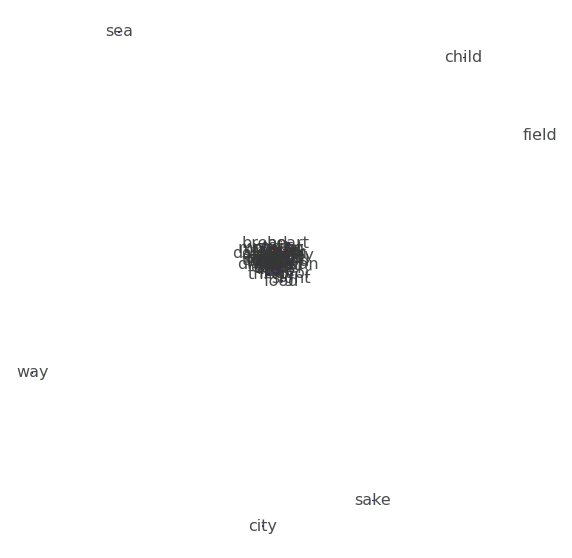

In [184]:
layout_nn = nx.spring_layout(gNN_bible, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nn = nx.eigenvector_centrality(gNN_bible)
maxC = max(centralities_nn.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNN_bible.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNN_bible.edges(data = True)))
nx.draw(gNN_bible, ax = ax, pos = layout_nn, labels = {n: n for n in gNN_bible.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN_bible.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nn[n] / maxC for n in gNN_bible.nodes],
        node_size = [centralities_nn[n] / maxC * 100 for n in gNN_bible.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:purple',
        cmap = plt.get_cmap('plasma'),
       )

Here we see that there are some words outside the main group. Let's take a close look at the group.

In [192]:
full = list(nx.connected_components(gNN_bible))
max_len = 0
for i in range(len(full)):
    if len(full[i])>max_len:
        a = i
        max_len = len(full[i])
print(full[a])

{'flock', 'woman', 'night', 'food', 'drink', 'man', 'head', 'tree', 'servant', 'morning', 'eye', 'brother', 'bread', 'seed', 'day', 'dream', 'father', 'daughter', 'fruit', 'grind', 'face', 'place', 'money', 'thing', 'favor', 'land', 'blood', 'hand', 'lot', 'sight', 'word', 'behold', 'time', 'heart', 'year', 'life', 'wife', 'sack', 'water', 'son', 'earth', 'camel'}


We can see that the index of large group is 0.

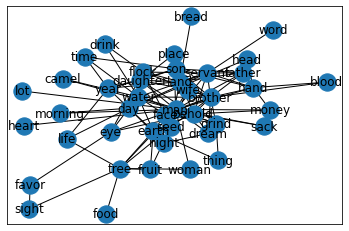

In [193]:
group = list(nx.connected_components(gNN_bible))[a]
nx.draw_networkx(nx.subgraph(gNN_bible, group))

In [194]:
sub_GNN = nx.subgraph(gNN_bible, group)

In [195]:
centralities_nn = nx.eigenvector_centrality(sub_GNN)
centralities_nn

{'hand': 0.2068094791020988,
 'year': 0.1092967592160627,
 'water': 0.2107556560762009,
 'life': 0.03945722662393787,
 'flock': 0.15743295731164927,
 'brother': 0.3799384846241563,
 'fruit': 0.04688348596489178,
 'face': 0.17638685279347224,
 'heart': 0.04283893006309221,
 'earth': 0.14298719778464516,
 'woman': 0.05501796392942667,
 'father': 0.1899847922535636,
 'son': 0.18263500439480973,
 'behold': 0.25747970732300196,
 'place': 0.11409406800802714,
 'thing': 0.030915227097917813,
 'word': 0.031382995418093265,
 'night': 0.07335381637611099,
 'tree': 0.10849420931038148,
 'man': 0.3816303770614039,
 'morning': 0.05784835142554475,
 'bread': 0.029398187199831075,
 'land': 0.26189471954390103,
 'wife': 0.19757453404644884,
 'money': 0.11770542482518156,
 'food': 0.012179033866334456,
 'drink': 0.04133033475089475,
 'grind': 0.13241644320196416,
 'lot': 0.04283893006309221,
 'head': 0.03822413313184667,
 'seed': 0.16617176604531503,
 'dream': 0.13813033074621467,
 'blood': 0.065863685

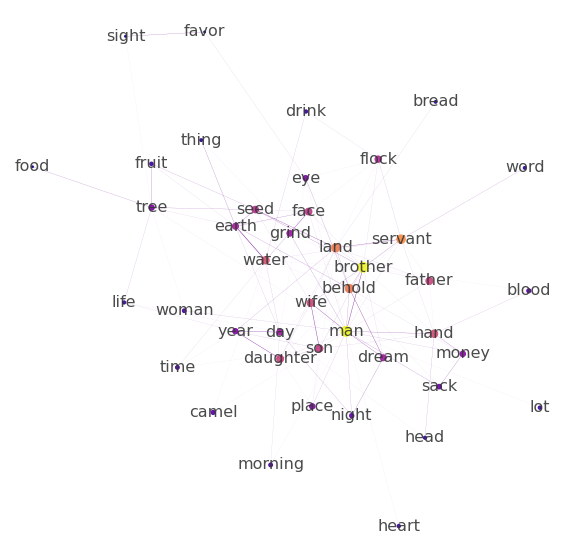

In [196]:
layout_nn = nx.spring_layout(sub_GNN, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nn = nx.eigenvector_centrality(sub_GNN)
maxC = max(centralities_nn.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in sub_GNN.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in sub_GNN.edges(data = True)))
nx.draw(sub_GNN, ax = ax, pos = layout_nn, labels = {n: n for n in sub_GNN.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in sub_GNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nn[n] / maxC for n in sub_GNN.nodes],
        node_size = [centralities_nn[n] / maxC * 100 for n in sub_GNN.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:purple',
        cmap = plt.get_cmap('plasma'),
       )

This result makes sense. 'father', 'man', 'day' are all important concepts in Bible.

### noun-verb pairs

In [197]:
gNV_bible = posCooccurrence(bible['normalized_sents'].sum(), 'NN', 'VB')
print(nx.info(gNV_bible))

Name: 
Type: Graph
Number of nodes: 774
Number of edges: 5385
Average degree:  13.9147


Let's remove:
1. co-occurrences between nouns and nouns as well as between verbs and verbs
2. low weight edges
3. low degree vertices

In [198]:
gNV_bible.remove_edges_from([(n1,n2) for n1,n2,d in gNV_bible.edges(data = True) 
                             if gNV_bible.nodes[n1]['bipartite'] == gNV_bible.nodes[n2]['bipartite']])
print(nx.info(gNV_bible))

Name: 
Type: Graph
Number of nodes: 774
Number of edges: 2283
Average degree:   5.8992


In [199]:
gNV_bible.remove_edges_from([(n1, n2) for n1, n2, d in gNV_bible.edges(data = True) if d['weight'] <= 2])
gNV_bible.remove_nodes_from([n for n in gNV_bible.nodes if len(set(gNV_bible.neighbors(n))) <= 5])
print(nx.info(gNV_bible))

Name: 
Type: Graph
Number of nodes: 30
Number of edges: 113
Average degree:   7.5333


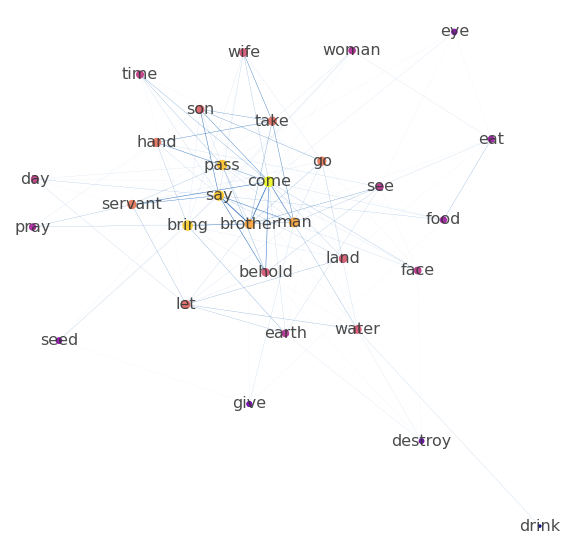

In [200]:
layout_nn = nx.spring_layout(gNV_bible, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nv = nx.eigenvector_centrality(gNV_bible)
maxC = max(centralities_nv.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV_bible.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV_bible.edges(data = True)))
nx.draw(gNV_bible, ax = ax, pos = layout_nn, labels = {n: n for n in gNV_bible.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNV_bible.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv[n] / maxC for n in gNV_bible.nodes],
        node_size = [centralities_nv[n] / maxC * 100 for n in gNV_bible.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

### "ego-networks" 

#### One link away

##### Creating the graph

In [201]:
g_1 = gNV_bible.subgraph(['son'] + list(gNV_bible.neighbors('son')))
print(nx.info(g_1))

Name: 
Type: Graph
Number of nodes: 8
Number of edges: 7
Average degree:   1.7500


##### Visualization

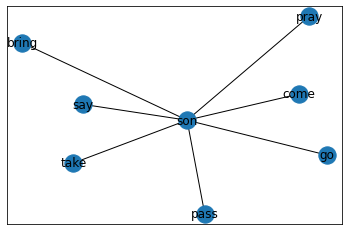

In [202]:
nx.draw_networkx(g_1)

##### Top 10 words in terms of degree centrality and eigenvector centrality

In [203]:
sorted(nx.degree_centrality(g_1).items(), key = lambda x: x[1], reverse = True)[:10]

[('son', 1.0),
 ('come', 0.14285714285714285),
 ('bring', 0.14285714285714285),
 ('say', 0.14285714285714285),
 ('take', 0.14285714285714285),
 ('pass', 0.14285714285714285),
 ('pray', 0.14285714285714285),
 ('go', 0.14285714285714285)]

In [204]:
sorted(nx.eigenvector_centrality(g_1).items(), key = lambda x: x[1], reverse = True)[:10]

[('son', 0.7071072096106684),
 ('come', 0.26726107998322923),
 ('bring', 0.26726107998322923),
 ('say', 0.26726107998322923),
 ('take', 0.26726107998322923),
 ('pass', 0.26726107998322923),
 ('pray', 0.26726107998322923),
 ('go', 0.26726107998322923)]

#### Two links away

##### Creating the graph

In [205]:
son_nei = gNV_bible.neighbors('son')
son_nei = set(son_nei)
print(son_nei)

{'come', 'bring', 'say', 'take', 'pass', 'pray', 'go'}


In [206]:
son_nei_plus1 = set(son_nei)
for n in son_nei:
    son_nei_plus1 |= set(gNV_bible.neighbors(n))
gNV_son2 = gNV_bible.subgraph(son_nei_plus1)
print(nx.info(gNV_son2))

Name: 
Type: Graph
Number of nodes: 24
Number of edges: 82
Average degree:   6.8333


##### Visualization

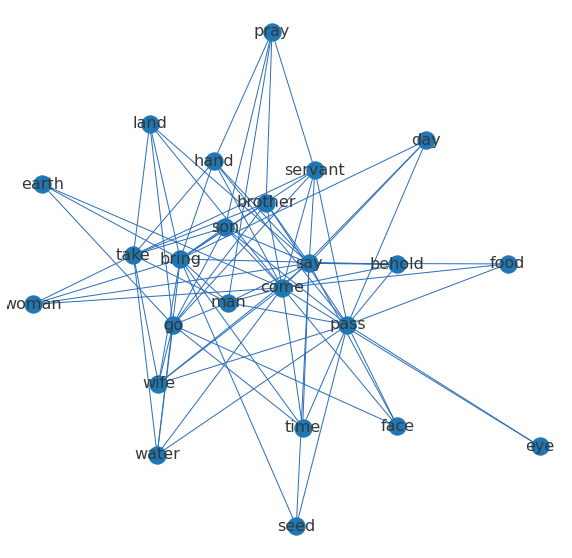

In [207]:
layout_story = nx.spring_layout(gNV_son2, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNV_son2, ax = ax, pos = layout_story, labels = {n: n for n in gNV_son2.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       )

##### Top 10 words in terms of degree centrality and eigenvector centrality

In [208]:
sorted(nx.degree_centrality(gNV_son2).items(), key = lambda x: x[1], reverse = True)[:10]

[('come', 0.6956521739130435),
 ('say', 0.6086956521739131),
 ('bring', 0.6086956521739131),
 ('pass', 0.6086956521739131),
 ('go', 0.43478260869565216),
 ('take', 0.3913043478260869),
 ('brother', 0.30434782608695654),
 ('son', 0.30434782608695654),
 ('man', 0.30434782608695654),
 ('servant', 0.30434782608695654)]

In [209]:
sorted(nx.eigenvector_centrality(gNV_son2).items(), key = lambda x: x[1], reverse = True)[:10]

[('come', 0.33226466833060925),
 ('bring', 0.3048514519122483),
 ('say', 0.30244542334625485),
 ('pass', 0.2942823627983484),
 ('go', 0.22992631921480136),
 ('brother', 0.2233445857164615),
 ('son', 0.2233445857164615),
 ('man', 0.2233445857164615),
 ('servant', 0.2233445857164615),
 ('take', 0.2186584312952415)]

#### Three links away

##### Creating the graph

In [210]:
son_3 = set(son_nei_plus1)

In [211]:
for n in son_nei_plus1:
    son_3 |= set(gNV_bible.neighbors(n))
gNV_son3 = gNV_bible.subgraph(son_3)
print(nx.info(gNV_son3))

Name: 
Type: Graph
Number of nodes: 30
Number of edges: 113
Average degree:   7.5333


##### Visualization

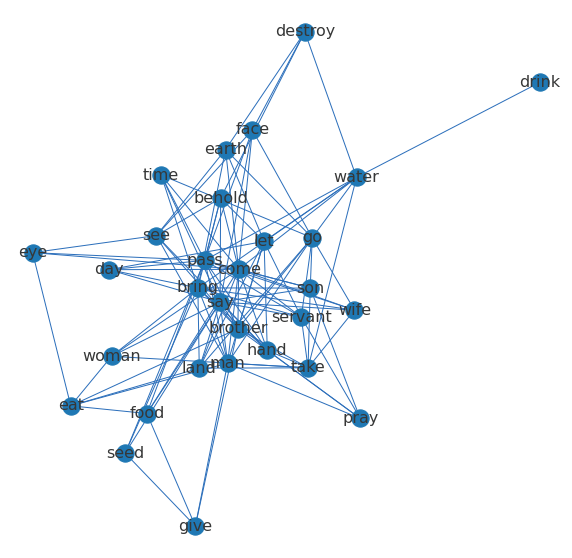

In [212]:
layout_story = nx.spring_layout(gNV_son3, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNV_son3, ax = ax, pos = layout_story, labels = {n: n for n in gNV_son3.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       )

##### Top 10 words in terms of degree centrality and eigenvector centrality

In [213]:
sorted(nx.degree_centrality(gNV_son3).items(), key = lambda x: x[1], reverse = True)[:10]

[('come', 0.5517241379310345),
 ('say', 0.48275862068965514),
 ('bring', 0.48275862068965514),
 ('pass', 0.48275862068965514),
 ('brother', 0.3793103448275862),
 ('man', 0.3793103448275862),
 ('go', 0.3448275862068966),
 ('take', 0.3103448275862069),
 ('let', 0.3103448275862069),
 ('hand', 0.27586206896551724)]

In [214]:
sorted(nx.eigenvector_centrality(gNV_son3).items(), key = lambda x: x[1], reverse = True)[:10]

[('come', 0.30743581662433705),
 ('bring', 0.2787313472934712),
 ('say', 0.2731914999822626),
 ('pass', 0.26845898017132774),
 ('brother', 0.2475963248699301),
 ('man', 0.2475963248699301),
 ('servant', 0.20953425756501687),
 ('go', 0.20912521681210067),
 ('hand', 0.20179038064017965),
 ('take', 0.19825197812595563)]

From the three ego-networks, we can see what are the words that are closely related to "son".

### A noun-adjective network

In [215]:
gNJ_bible = posCooccurrence(bible['normalized_sents'].sum(), 'NN', 'JJ')
print(nx.info(gNJ_bible))

Name: 
Type: Graph
Number of nodes: 798
Number of edges: 4110
Average degree:  10.3008


By filtering by a centrality measure we can get a more 'central' set of nodes instead of just the most connected.

In [216]:
gNJ_filtered_bible = filterWords(gNJ_bible, minWeight=3, filter_='betweenness', rule='number', value_of_rule=20)
print(nx.info(gNJ_filtered_bible))

Total number of nodes(after filtering) in the graph is 20
Name: 
Type: Graph
Number of nodes: 20
Number of edges: 78
Average degree:   7.8000


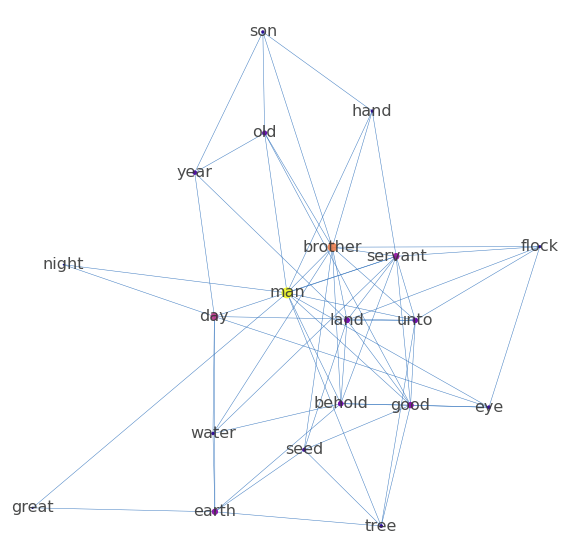

In [217]:
layout_NJ_filtered_bible = nx.spring_layout(gNJ_filtered_bible, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj200 = nx.betweenness_centrality(gNJ_filtered_bible)
maxC = max(centralities_nj200.items(), key = lambda x : x[1])[1]
nx.draw(gNJ_filtered_bible, ax = ax, pos = layout_NJ_filtered_bible, labels = {n: n for n in gNJ_filtered_bible.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_nj200[n] / maxC for n in gNJ_filtered_bible.nodes],
        node_size = [centralities_nj200[n] / maxC * 100 for n in gNJ_filtered_bible.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

The first book， Genesis, introduces the origin of the universe (in the beginning God created heaven and earth), the origin of mankind (God created Adam and Eve) and the origin of the Jewish nation, as well as the footprints of the Jewish ancestors. We show how perfect God's creation is, how mankind has fallen, and how a nation has been chosen and developed by God.

From all the analysis above, we can see that many words frequently appear in these "central" plots, like 'good','day','earth', 'great', etc. These are very important concepts in Bible. From these words we can see the networks can basically reflect what is stated in Genesis.

## Creating networks of agents from corpora

Now that we have an idea of how we can use networks in python (a useful skill to know!), let us see how we can now use our knowledge of networks on extracting actors from corpora and building relations from them. Let us use the soap opera corpus now. 

In the last notebook we wrote methods to load corpora - this has been added to lucem_illud_2020.
The code returns a dictionary with each id mapping to the text associated with it. 

We would then use the source file to create the dataframe with the data - since this varies for each corpora, there is no built in function, but would follow a similar process.

This function might take some time.

In [218]:
corpora_address = "C:\\Users\\mac\\Desktop\\Content-Analysis-2020\\corpora\\SOAP"

In [219]:
soap_texts = lucem_illud_2020.loadDavies(corpora_address, num_files=2000)

text_0-tez.zip
text_1-teh.zip
text_2-wts.zip
text_3-pem.zip
text_4-jfy.zip
text_5-rag.zip
text_6-egn.zip
text_7-jss.zip
text_8-sbo.zip
text_9-jtw.zip


We now use the source to see how the data is stored. Note that this is different from the movies corpus, and that we will need to use a different aggregating method to store the data. Each dataset would have a different approach, but they are all very similar, it depends on how the data is stored. Here multiple textids match multiple scripts, so our soap dataframe would be structured a little differently. 

You can see the first 20 lines of the source file here.

In [220]:
import zipfile

In [221]:
zfile = zipfile.ZipFile(corpora_address + "/soap_sources.zip")
source = []

In [222]:
for file in zfile.namelist():
    with zfile.open(file) as f:
        for line in f:
            source.append(line)

In [223]:
source[0:20]

[b'textID\tyear\tshow\t\turl\r\n',
 b'-----\t-----\t-----\t\t-----\r\n',
 b'\r\n',
 b'1\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-04-09-01.shtml\r\n',
 b'2\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-05-09-01.shtml\r\n',
 b'3\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-06-20-01.shtml\r\n',
 b'4\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-07-01.shtml\r\n',
 b'5\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-08-01.shtml\r\n',
 b'6\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-09-01.shtml\r\n',
 b'7\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-10-01.shtml\r\n',
 b'8\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-13-01.shtml\r\n',
 b'9\t2001\tAll My Childen\thttp://tvmegasite.net/tra

In [224]:
import pandas as pd

In [225]:
soap_dict = {}

In [226]:
for soap in source[3:]:
    try:
        textID, year, show, url = soap.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    if show.strip() not in soap_dict:
        soap_dict[show.strip()] = []
    if show.strip() in soap_dict:
        try:
            soap_dict[show.strip()].append(soap_texts[textID.strip()])
        except KeyError:
            continue

In [227]:
soap_dict.keys()

dict_keys(['All My Childen', 'As the World Turns', 'Bold and Beautiful', 'Days of Our Lives', 'General Hospital', 'Guiding Light', 'One Life to Live', 'Passions', 'Port Charles', 'Young and Restless'])

In [228]:
soap_df = pd.DataFrame(columns=["Soap Name", "Tokenized Texts"])

In [229]:
i = 0

In [230]:
for soap in soap_dict:
    # since there were multiple lists
    print(soap)
    full_script = []
    for part in soap_dict[soap]:
        full_script = full_script + part
    soap_df.loc[i] = [soap, full_script]
    i += 1

All My Childen
As the World Turns
Bold and Beautiful
Days of Our Lives
General Hospital
Guiding Light
One Life to Live
Passions
Port Charles
Young and Restless


In [231]:
soap_df

,Soap Name,Tokenized Texts
0,All My Childen,"[@!Liza, You, 're, in, early, @!Ryan, Yeah, I,..."
1,As the World Turns,"[@!Katie, Simon, where, are, you, @!Simon, Kat..."
2,Bold and Beautiful,"[@!Morgan, What, 's, the, matter, Stephanie, Y..."
3,Days of Our Lives,"[@!Philip, Seems, like, every, time, I, look, ..."
4,General Hospital,"[@!Stefan, I, love, her, @!Jax, No, Cassadine,..."
5,Guiding Light,"[@!Reva, Well, it, 's, very, peaceful, Your, b..."
6,One Life to Live,"[@!Rae, What, She, even, has, a, new, friend, ..."
7,Passions,"[@!Kay, Going, to, get, pregnant, and, I, 'm, ..."
8,Port Charles,"[@!Jack, There, you, are, you, son, @!Chris, H..."
9,Young and Restless,"[@!Sharon, Yeah, I, could, n't, sleep, @!Victo..."


We now have each Soap, and each of the Tokenized texts. Let us see what kind of information we can get. These are American soap operas, and are likely to be cheesy and dramatic (an understatment). A fun start would be to make networks of each of the actors and actresses in these soaps. 

What would be a good way to create a network? Maybe everytime someone talks to someone we add one weight? But we wouldn't want to add weights whenever it's a different scene - or maybe we do? Let us look at the text and figure it out.

Note that we didn't add the year here because it spans over multiple years. If we are doing different kinds of analysis we would want to a years column as well.

In my dataframe, Days of Our Lives is the 9th corpora, and I conducted my basic analysis on that.

In [232]:
dool = soap_df['Tokenized Texts'][3]

In [233]:
' '.join(dool[0:1500])

"@!Philip Seems like every time I look at you tonight you 're crying @!Chloe Tears of happiness I always thought that when I read Tears of Happiness what a crock But tonight you prove to me that they really do exist @!Philip I just carved our initials on that tree @!Chloe But it was so much more than that You took this angry outsider and you made her feel like a girl in a movie or a book a happy movie or a book @!Philip That 's what you deserve to be What gets me is that you do n't even realize how special you are @!Chloe All my life the word special was code for too weird for words And now here you are this great looking guy with a normal life and you make me believe like you really actually want me around @!Philip Oh that 's only half true @!Chloe Oh I 'm sorry @!Philip Oh no Chloe I want you around forever That 's so true but 's not true at all Except for you there 's nothing normal at all about my life @!Brenda We got to get the labs back on 23 @!Woman I 'll grab them @!Brenda Okay

Hmmm... we can't do our normal text processing. But this provides us with an interesting oppurtunity: every '@!' is followed by some useeful information. Let us do a quick check of how many characters exist here, and how many times they speak.

In [234]:
characters = {}

In [235]:
for token in dool:
    if token[0] == '@':
        # all characters or actions start with @, so we add that to character
        if token[2:] not in characters:
            characters[token[2:]] = 0
        if token[2:] in characters:
            characters[token[2:]] += 1


In [236]:
len(characters)

878

Wow, that's a lot of characters: but we notice a '@!' between certain actions too, such as screaming and sobbing. Let us maybe only look for characters with a high number of appearances?

In [237]:
for character in characters:
    if characters[character] > 2000:
        print(character, characters[character])

Philip 2846
Bo 4179
Shawn 2507
Hope 3793
Belle 2518
John 2542
Brady 2265
Marlena 2458
Nicole 2892
Kate 2503
Sami 5462
Lucas 2546


Let's check these folks out on the interwebz...a image of search of the name + "days of our lives":

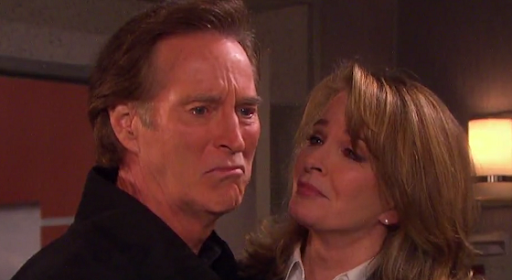

In [238]:
Image(filename='../data/dool/dool_john.png') 

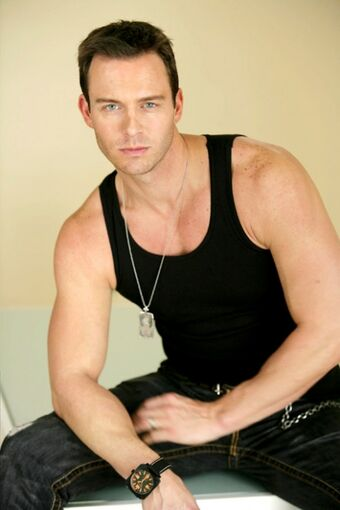

In [239]:
Image(filename='../data/dool/dool_brady.jpg') 

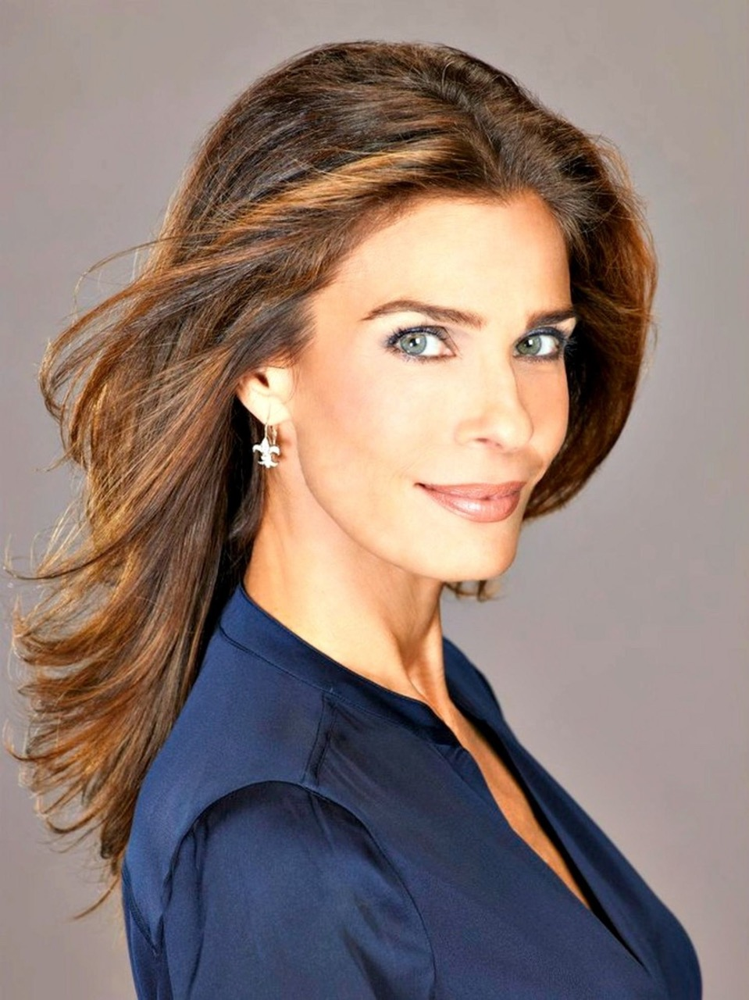

In [240]:
Image(filename='../data/dool/dool_hope.jpeg')

In [241]:
# Image(filename='../data/dool/dool_philip.jpeg')

In [242]:
# Image(filename='../data/dool/dool_marlena.jpg')

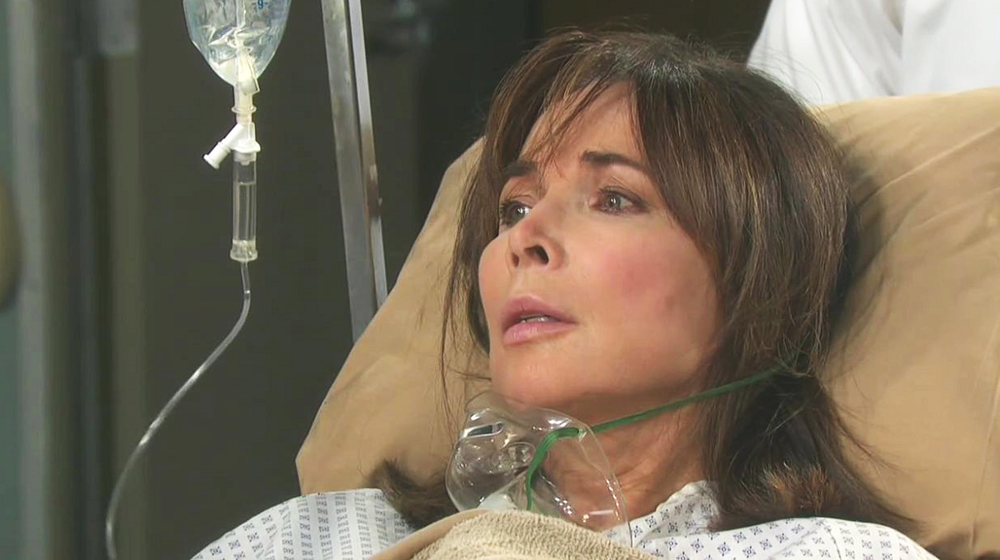

In [243]:
Image(filename='../data/dool/dool_kate.png')

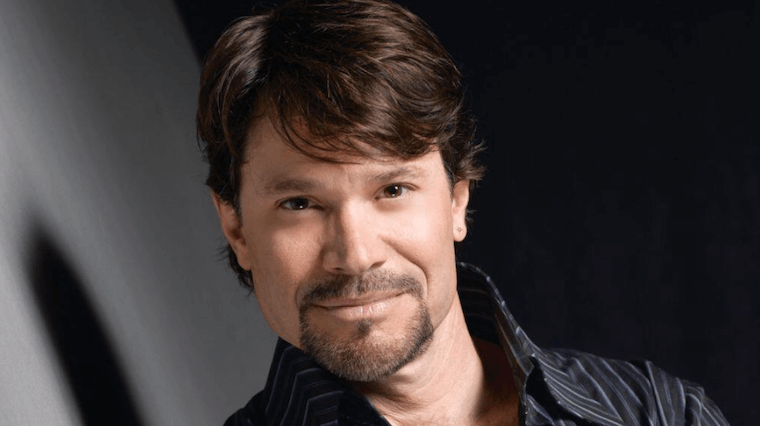

In [244]:
Image(filename='../data/dool/dool_bo.png')

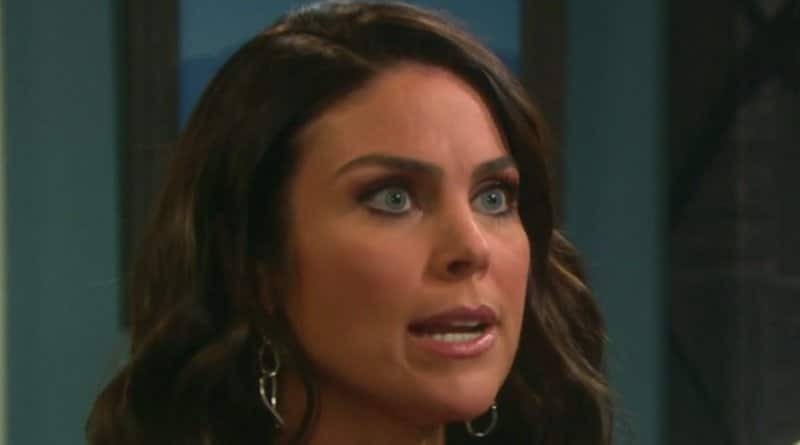

In [245]:
Image(filename='../data/dool/dool_chloe.jpg')

In [246]:
# Image(filename='../data/dool/dool_sami.jpg')

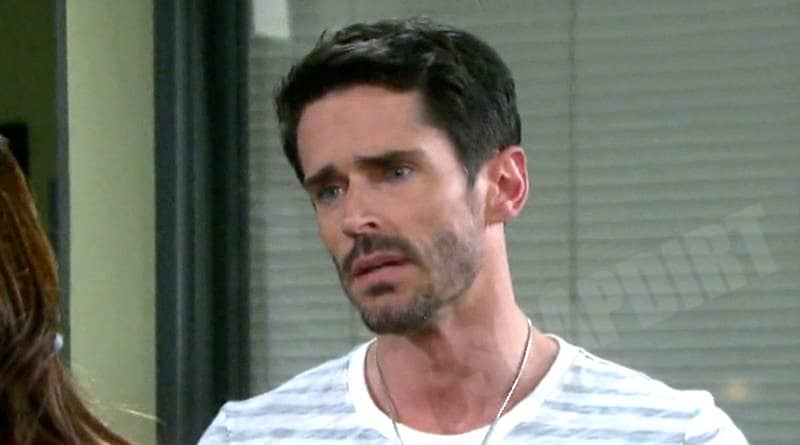

In [247]:
Image(filename='../data/dool/dool_shawn.jpg')

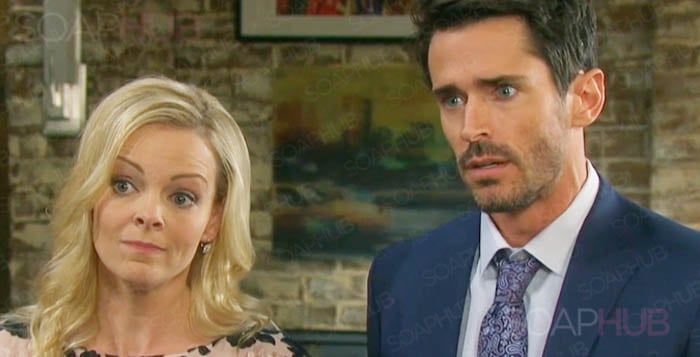

In [248]:
Image(filename='../data/dool/dool_belle.jpg')

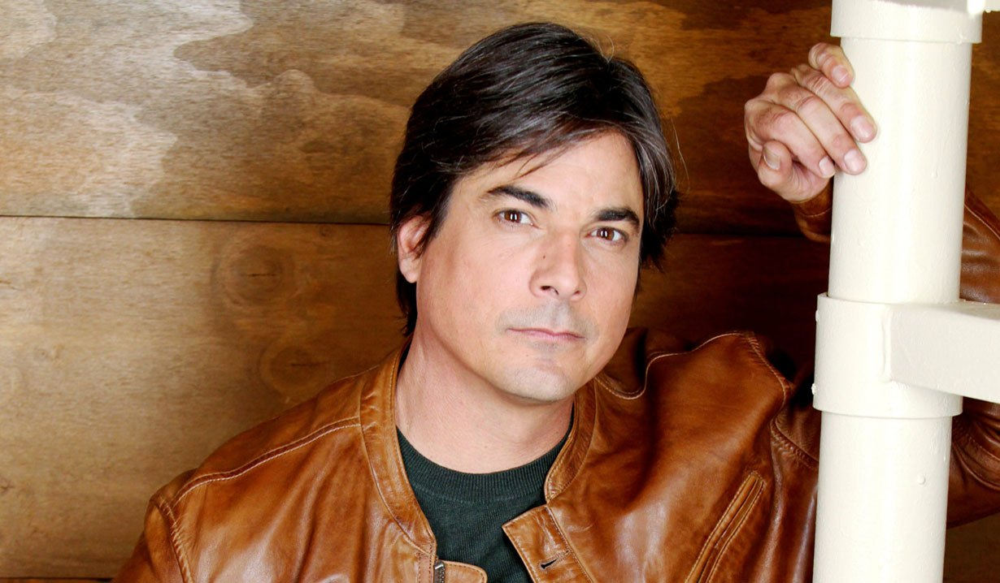

In [249]:
Image(filename='../data/dool/dool_lucas.jpg')

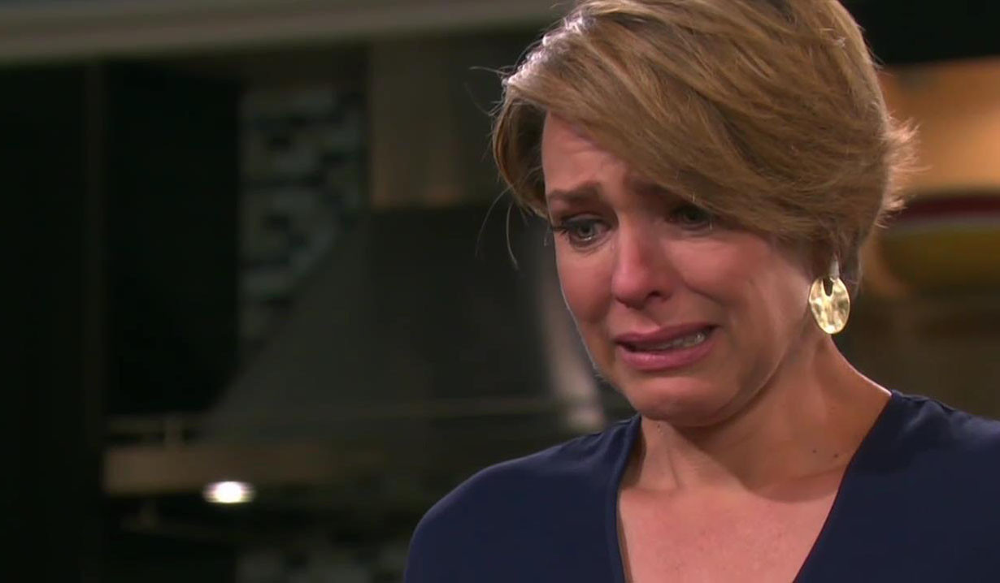

In [250]:
Image(filename='../data/dool/dool_nicole.jpg')

These are definitely big, long-time players in the dramatic Days narrative. It would make sense to create a graph where each character who appears over 2000 times is a node, and each time they talk to each other, we add one to their weight. We should also store all the things these chracters say: that's useful information.

So we now iterate through the tokens in a manner where we can capture this information.

In [251]:
actor_network = nx.Graph()

In [252]:
for character in characters:
    if characters[character] > 2000:
        actor_network.add_node(character, lines_spoken= characters[character], words=[])

In [253]:
len(actor_network.nodes.data())

12

In [254]:
actor_network.nodes.data()

NodeDataView({'Philip': {'lines_spoken': 2846, 'words': []}, 'Bo': {'lines_spoken': 4179, 'words': []}, 'Shawn': {'lines_spoken': 2507, 'words': []}, 'Hope': {'lines_spoken': 3793, 'words': []}, 'Belle': {'lines_spoken': 2518, 'words': []}, 'John': {'lines_spoken': 2542, 'words': []}, 'Brady': {'lines_spoken': 2265, 'words': []}, 'Marlena': {'lines_spoken': 2458, 'words': []}, 'Nicole': {'lines_spoken': 2892, 'words': []}, 'Kate': {'lines_spoken': 2503, 'words': []}, 'Sami': {'lines_spoken': 5462, 'words': []}, 'Lucas': {'lines_spoken': 2546, 'words': []}})

In [255]:
actor_network.nodes['Sami']['lines_spoken']

5462

In [256]:
i = 0

The following lines of code creates the graph. Please carefully go through the code: you should be able to understand (more or less) what is going on here. 

In [257]:
for token in dool:
    i += 1
    if i > len(dool):
        break
    if token[0] == "@":
        if token[2:] in actor_network.nodes():
            j = i
            for token_ in dool[i:]:
                if token_[0] == "@":
                    # if both the characters exist in the graph, add a weight
                    if token_[2:] != token[2:] and token_[2:] in actor_network.nodes():
                        if (token[2:], token_[2:]) not in actor_network.edges():
                            actor_network.add_edge(token[2:], token_[2:], weight=0)
                        if (token[2:], token_[2:]) in actor_network.edges():
                            actor_network.edges[(token[2:], token_[2:])]['weight'] += 1
                    break
                j += 1
            # adding characters sentences
            actor_network.nodes[token[2:]]['words'].append(dool[i:j])

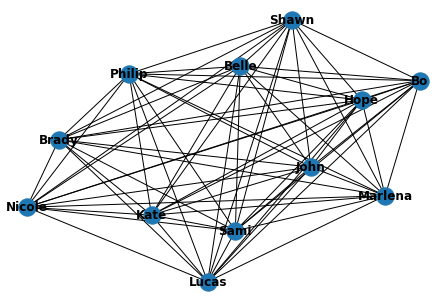

In [258]:
nx.draw(actor_network, with_labels=True, font_weight='bold')

In [259]:
import seaborn as sns

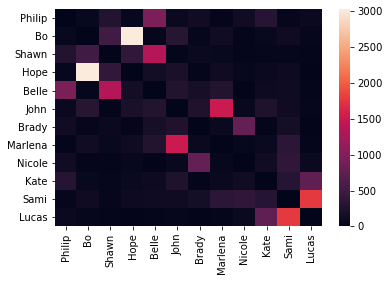

In [260]:
L = []
for node in actor_network.nodes():
    l = []
    for node_ in actor_network.nodes():
        if node == node_:
            l.append(0)
        else:
            l.append(actor_network.edges[(node, node_)]['weight'])
    L.append(l)
M_ = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M_, columns = list(actor_network.nodes()), index = list(actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

In [261]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(actor_network))

In [262]:
c

[frozenset({'Belle',
            'Bo',
            'Brady',
            'Hope',
            'John',
            'Kate',
            'Lucas',
            'Marlena',
            'Nicole',
            'Philip',
            'Sami',
            'Shawn'})]

### Finding structure in networks

We now have a lot of useful information: we have a graph of all the characters, with their relationships with other characters, as well as all the words they've said. We tried finding communities, but it seems like everyone is connected to everyone: each of them form their own 'community'. Seems like people talk to each other a bunch in soaps.

This is however, not the best network to find any meaningful patterns, as we can see with everyone connected to everyone. But as we can see with our heatmap, not everyone talks to everyone an equal amount. How about we only keep our "important" ties, where people are talking to each other a lot?

In [263]:
smaller_actor_network = nx.Graph()

In [264]:
for actor_1 in actor_network.nodes():
    smaller_actor_network.add_node(actor_1, lines_spoken= actor_network.nodes[actor_1]['lines_spoken'], words=actor_network.nodes[actor_1]['words'])
    for actor_2 in actor_network.nodes():
        if actor_2!=actor_1 and actor_network.edges[(actor_1, actor_2)]['weight'] > 250:
            smaller_actor_network.add_edge(actor_1, actor_2, weight=actor_network.edges[(actor_1, actor_2)]['weight'])


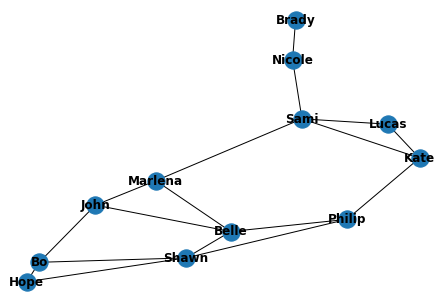

In [265]:
nx.draw(smaller_actor_network, with_labels=True, font_weight='bold')

This is a lot more interesting: while the sets of characters overlap, there is still two distinct communities if you look at characters who regularly talk to each other!

Let us see what our centrality measures look like, as well as communities.

In [266]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(smaller_actor_network))

In [267]:
c

[frozenset({'Belle',
            'Bo',
            'Brady',
            'Hope',
            'John',
            'Kate',
            'Lucas',
            'Marlena',
            'Nicole',
            'Philip',
            'Sami',
            'Shawn'})]

In [268]:
dcentralities = nx.degree_centrality(smaller_actor_network)

In [269]:
dcentralities['John'], dcentralities['Philip']

(0.2727272727272727, 0.2727272727272727)

Our two different communities show up as detected by the networkx algorithm, and when we look at centralities, we can see that John is a lot more central than Philip.

Let us go back to our original graph, and see if the weight or number of similar appearences matches the text... how do we do this? Well, we already have the graph, and we also have information of who spoke to who. So we have our framework!

This means we can explore ideas contained in two of the papers you will be reading: . “No country for old members: User lifecycle and linguistic change in online communities.”, and  “Fitting In or Standing Out? The Tradeoffs of Structural and Cultural Embeddedness”, both of which you can access on Canvas. 

Let us use a simplified version of the papers, and check if a higher number of conversations might lead to a higher similarity between the word distributions for two characters. We can use the same divergences we used in the last notebook. Do you think it will match with the number of times each character was associated with each other?

In [270]:
import nltk

In [271]:
def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pandas.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pandas.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

In [272]:
corpora = []
for character in actor_network.nodes():
    character_words = []
    for sentence in actor_network.nodes[character]['words']:
        for word in sentence:
            character_words.append(word)
    corpora.append(lucem_illud_2020.normalizeTokens(character_words))

In [273]:
L = []

In [274]:
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)

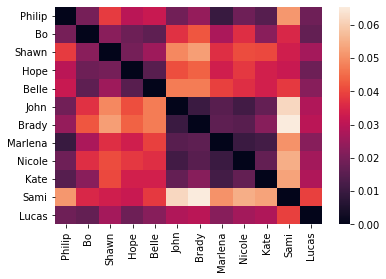

In [275]:
fig = plt.figure()
div = pandas.DataFrame(M, columns = list(actor_network.nodes()), index = list(actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

In [276]:
# np.corrcoef(M_, M)[0]

With our two heatplots, we can attempt to do some rudimentary analysis. We can see from our previous plot that Shawn and Belle talk to each other a lot, so do Hope and Bo, and Nicole and Brady, and Lucas and Sami. Do they also talk *like* each other?

Kind of, actually: all four of these pairs have a lower distance between them. Now I don't know anything about this particular soap... are these four pairs related? Are they in a relationship, either married or dating, or are they just really good friends?

This lays out the frameworks which you can now use to explore your own networks. 

# Interactional influence

In a recent paper by Fangjian Guo, Charles Blundell, Hanna Wallach, and Katherine Heller entitled ["The Bayesian Echo Chamber: Modeling Social Influence via Linguistic Accommodation"](https://arxiv.org/pdf/1411.2674.pdf), the authors develop a method to estimate the influence of one speaker on another in order to estimate a kind of interpersonal influence network. Here we walk through this method, which relies on a kind of point process called a Hawkes process that estimate the influence of one point on another. Specifically, what they estimate is the degree to which one actor to an interpersonal interaction engaged in "accomodation" behaviors relative to the other, generating a directed edge from the one to the other.

### First let's look at the output of their analysis:

In [277]:
example_name = '12-angry-men'   #example datasets: "12-angry-men" or "USpresident"

In [278]:
result_path = '../data/Bayesian-echo/results/{}/'.format(example_name)
if not os.path.isdir(result_path):
    raise ValueError('Invalid example selected, only "12-angry-men" or "USpresident" are avaliable')

In [279]:
df_meta_info = pandas.read_table(result_path + 'meta-info.txt',header=None)
df_log_prob = pandas.read_csv(result_path + "SAMPLE-log_prior_and_log_likelihood.txt",delim_whitespace=True) #log_prob samples
df_influence = pandas.read_csv(result_path + 'SAMPLE-influence.txt',delim_whitespace=True) # influence samples
df_participants = pandas.read_csv(result_path + 'cast.txt', delim_whitespace=True)
person_id = pandas.Series(df_participants['agent.num'].values-1,index=df_participants['agent.name']).to_dict()
print()
print ('Person : ID')
person_id


Person : ID


{'Juror 8': 0,
 'Juror 3': 1,
 'Juror 10': 2,
 'Foreman': 3,
 'Juror 7': 4,
 'Juror 4': 5,
 'Juror 11': 6,
 'Juror 12': 7,
 'Juror 6': 8,
 'Juror 2': 9,
 'Juror 9': 10,
 'Juror 5': 11}

In [280]:
def getDensity(df):
    data = df#_log_prob['log.prior']
    density = scipy.stats.gaussian_kde(data)
    width = np.max(data) - np.min(data)
    xs = np.linspace(np.min(data)-width/5, np.max(data)+width/5,600)
    density.covariance_factor = lambda : .25
    density._compute_covariance()
    return xs, density(xs)

### Plot MCMC (Markov Monte Carlo) trace and the density of log-likelihoods

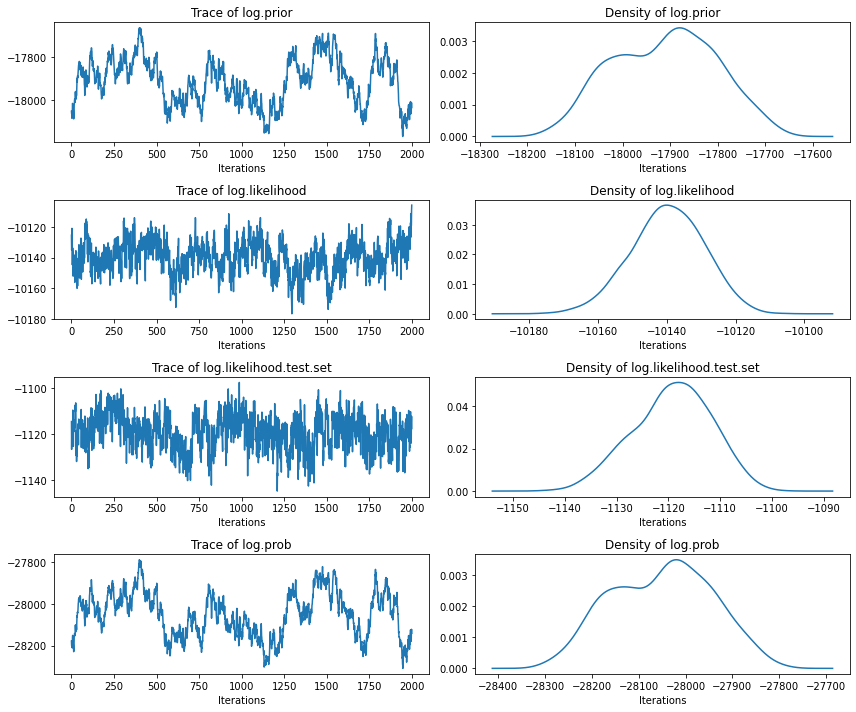

In [281]:
fig = plt.figure(figsize=[12,10])

plt.subplot(4,2,1)
plt.plot(df_log_prob['log.prior'])
plt.xlabel('Iterations')
plt.title('Trace of log.prior')

plt.subplot(4,2,2)
x,y = getDensity(df_log_prob['log.prior'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prior')

plt.subplot(4,2,3)
plt.plot(df_log_prob['log.likelihood'])
plt.title('Trace of log.likelihood')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,4)
x,y = getDensity(df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood')

plt.subplot(4,2,5)
plt.plot(df_log_prob['log.likelihood.test.set'])
plt.title('Trace of log.likelihood.test.set')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,6)
x,y = getDensity(df_log_prob['log.likelihood.test.set'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood.test.set')

plt.subplot(4,2,7)
plt.plot(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.title('Trace of log.prob')
plt.xlabel('Iterations')

plt.subplot(4,2,8)
x,y = getDensity(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prob')

plt.tight_layout()

plt.show()

### Plot the influence matrix between participants

In [282]:
A = int(np.sqrt(len(df_influence.columns))) #number of participants
id_person = {}
for p in person_id:
    id_person[person_id[p]]=p

In [283]:
def getmatrix(stacked,A):
    influence_matrix = [[0 for i in range(A)] for j in range(A)]
    for row in stacked.iteritems():
        from_ = int(row[0].split('.')[1])-1
        to_ = int(row[0].split('.')[2])-1
        value = float(row[1])
        influence_matrix[from_][to_]=value
    df_ = pandas.DataFrame(influence_matrix) 
    
    df_ =df_.rename(index = id_person)
    df_ =df_.rename(columns = id_person)
    return df_

In [284]:
stacked = df_influence.mean(axis=0)
df_mean = getmatrix(stacked,A)

stacked = df_influence.std(axis=0)
df_std = getmatrix(stacked,A)

In [285]:
df_mean

,Juror 8,Juror 3,Juror 10,Foreman,Juror 7,Juror 4,Juror 11,Juror 12,Juror 6,Juror 2,Juror 9,Juror 5
Juror 8,0.000000,3.757957,8.089079,0.930180,5.167497,0.794645,0.845335,1.336329,6.106684,0.916765,6.385205,7.300776
Juror 3,8.529312,0.000000,6.673916,4.150076,2.534751,4.902852,1.092571,0.509942,3.825015,3.861767,0.266426,1.561626
Juror 10,8.413188,7.427932,0.000000,4.540236,3.216307,1.030049,1.004598,0.529232,2.426582,0.407460,1.233599,0.885871
Foreman,1.137060,0.612615,1.945196,0.000000,1.521390,0.834870,1.338554,3.230634,1.013511,3.534036,1.311436,4.115411
Juror 7,2.603853,5.901169,0.648844,1.969868,0.000000,1.110101,0.279870,0.608548,1.047693,2.910670,1.619475,1.570038
Juror 4,5.791320,0.200669,0.266484,0.582956,0.094200,0.000000,3.347982,0.316963,0.300770,2.112033,0.370973,0.673364
Juror 11,0.378515,0.544628,0.779340,0.454645,0.290575,0.447512,0.000000,0.614536,0.821143,0.951222,0.476986,0.844157
Juror 12,5.961338,0.695831,0.519459,1.253033,0.247939,0.162463,0.388620,0.000000,2.500976,2.375977,0.481394,0.834032
Juror 6,4.526244,0.923784,0.503503,1.049825,1.288920,0.451562,0.375776,0.904313,0.000000,2.861587,0.905421,0.310822
Juror 2,0.583732,2.303417,0.529583,1.722894,2.005939,0.299311,0.652302,1.623813,0.841376,0.000000,1.691612,1.756225


MEAN of influence matrix (row=from, col=to)


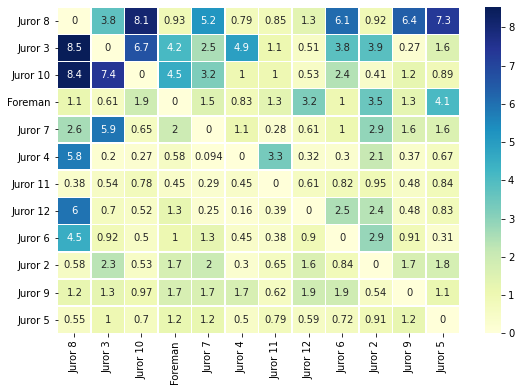

In [286]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_mean, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('MEAN of influence matrix (row=from, col=to)')
plt.show()

SD of influence matrix (row=from, col=to)


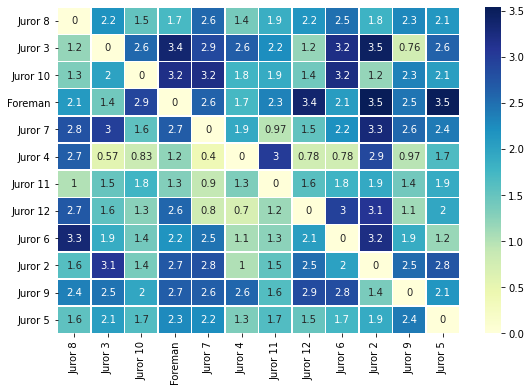

In [287]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_std, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('SD of influence matrix (row=from, col=to)')
plt.show()

### Barplot of total influences sent/received

In [288]:
sender_std = {} #sd of total influence sent
reciever_std = {} #sd of total influence recieved
for i in range(A):
    reciever_std[id_person[i]] = df_influence[df_influence.columns[i::A]].sum(axis=1).std()
    sender_std[id_person[i]] = df_influence[df_influence.columns[i*A:(i+1)*A:]].sum(axis=1).std()

sent = df_mean.sum(axis=1) #mean of total influence sent
recieved =df_mean.sum(axis=0) #mean of total influence recieved

Total influence:

		Total linguistic influence sent/received 


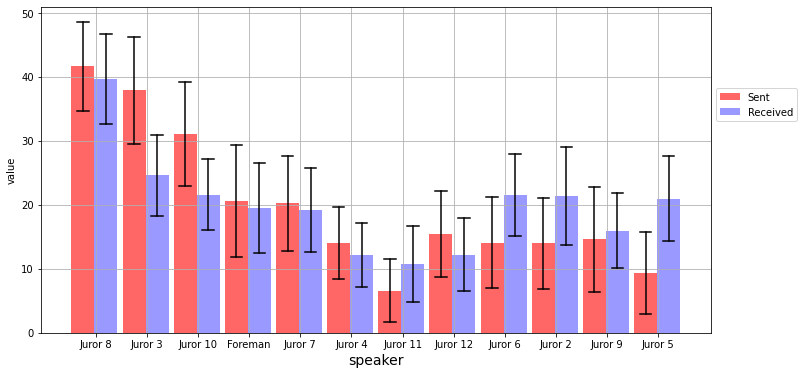

In [289]:
print ("\t\tTotal linguistic influence sent/received ")
ax.fig = plt.figure(figsize=[np.min([A,20]),6])

plt.grid()
wd=0.45
ii=0
for p in sender_std:
    plt.bar(person_id[p],sent.loc[p],width=wd,color='red',alpha=0.6,label = "Sent" if ii == 0 else "")
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]+sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]-sender_std[p],sent.loc[p]-sender_std[p]],color='k')
    plt.plot([person_id[p],person_id[p]],[sent.loc[p]-sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    ii+=1
ii=0
for p in reciever_std:
    plt.bar(person_id[p]+wd,recieved.loc[p],width=wd,color='blue',alpha=0.4,label = "Received" if ii == 0 else "")
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]+reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]-reciever_std[p],recieved.loc[p]-reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd,person_id[p]+wd],[recieved.loc[p]-reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    ii+=1
plt.legend(loc='center left', bbox_to_anchor=(1, 0.7))
plt.xticks([i+0.25 for i in range(A)],list(zip(*sorted(id_person.items())))[1])
plt.ylabel('value')
plt.xlabel('speaker',fontsize=14)
plt.show()

## Visualize Influence Network!

You can visualize any of the influence matrices above:

Using networkx:

In [290]:
def drawNetwork(df,title):
    fig = plt.figure(figsize=[8,8])
    G = nx.DiGraph()
    for from_ in df.index:
        for to_ in df.columns:
            G.add_edge(from_,to_,weight = df.loc[from_][to_])
            
    pos = nx.spring_layout(G,k=0.55,iterations=20)
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())
    weights = np.array(weights)
    #weights = weights*weights
    weights = 6*weights/np.max(weights)
    print(title)
    
    edge_colors=20*(weights/np.max(weights))
    edge_colors = edge_colors.astype(int)
#     nx.draw_networkx_nodes(G,pos,node_size=1200,alpha=0.7,node_color='#99cef7')
#     nx.draw_networkx_edges(G,pos,edge_color=edge_colors)
#     nx.draw_networkx_labels(G,pos,font_weight='bold')
    nx.draw(G,pos,with_labels=True, font_weight='bold',width=weights,\
            edge_color=255-edge_colors,node_color='#99cef7',node_size=1200,\
            alpha=0.75,arrows=True,arrowsize=20)
    return edge_colors

In [291]:
# get quantile influence matrices for 25%, 50%, 75% quantile
stacked = df_influence.quantile(0.25)
df_q25 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.5)
df_q50 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.75)
df_q75 = getmatrix(stacked,A)

Mean Influence Network


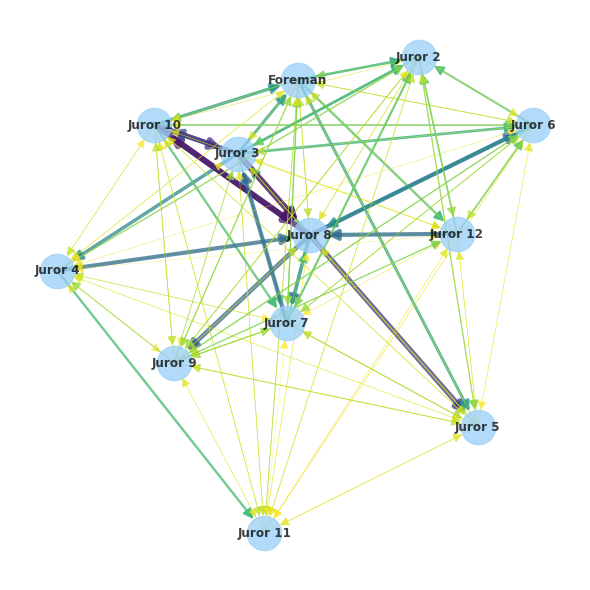

In [292]:
G_mean = drawNetwork(df_mean,'Mean Influence Network')

25 Quantile Influence Network


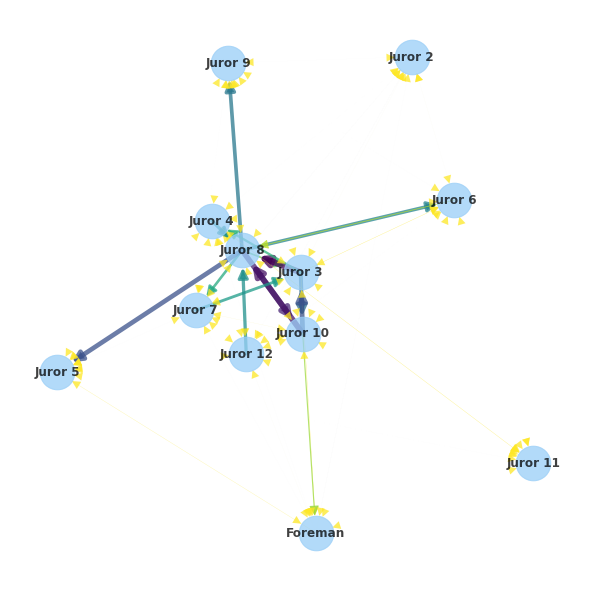

In [293]:
G_q25 = drawNetwork(df_q25,'25 Quantile Influence Network')

75 Quantile Influence Network


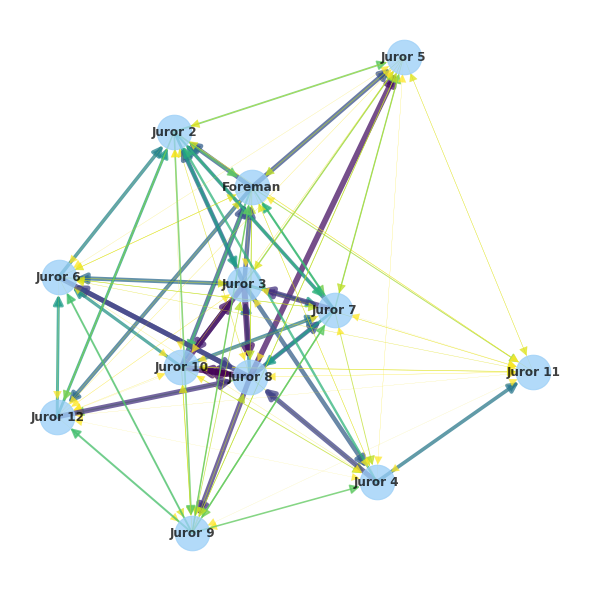

In [294]:
G_q75 = drawNetwork(df_q75,'75 Quantile Influence Network')

In [295]:
import lucem_illud_2020
import pandas
def fakeEnglish(length):
    listd=['a','b','c','d','e','f','g','s','h','i','j','k','l']
    return ''.join(np.random.choice(listd,length))

Your own dataset should contains 4 columns (with the same column names) as the artificial one below:

- name: name of the participant
- tokens: a list of tokens in one utterance
- start: starting time of utterance (unit doesn't matter, can be 'seconds','minutes','hours'...)
- end: ending time of utterance (same unit as start)

There is no need to sort data for the moment.

Below, we generate a fake collection of data from "Obama", "Trump", "Clinton"...and other recent presidents. You can either create your own simulation OR (better), add real interactional data from a online chat forum, comment chain, or transcribed from a conversation.

In [296]:
script= []
language = 'eng' #parameter, no need to tune if using English, accept:{'eng','chinese'}
role = 'Adult' #parameter, no need to tune 

for i in range(290):
    dt = []
    dt.append(np.random.choice(['Obama','Trump','Clinton','Bush','Reagan','Carter','Ford','Nixon','Kennedy','Roosevelt']))
    faketokens = [fakeEnglish(length = 4) for j in range(30)]
    dt.append(faketokens) #fake utterance
    dt.append(i*2+np.random.random()) # start time
    dt.append(i*2+1+np.random.random()) # end time
    script.append(dt)

df_transcript = pandas.DataFrame(script,columns=['name','tokens','start','end']) #"start", "end" are timestamps of utterances, units don't matter
df_transcript[:2]

,name,tokens,start,end
0,Reagan,"[ljlk, djhl, gebs, akaj, jieh, lgdl, cdlh, bbh...",0.512252,1.303933
1,Trump,"[sige, jlba, lseh, iigl, hcea, kjbl, eihb, ick...",2.651135,3.193183


Transform data into TalkbankXML format:

In [297]:
output_fname = 'USpresident.xml'  #should be .xml
language = 'eng' 
#language = 'chinese'
lucem_illud_2020.make_TalkbankXML(df_transcript, output_fname, language = language )

New File saved to .\data\USpresident\USpresident.xml


0

Run Bayesian Echo Chamber to get estimation.

- It may take a couple of hours. ( About 4-5 hours if Vocab_size=600 and sampling_time =2000)
- Larger "Vocab_size" (see below) will cost more time
- Larger "sampling_time" will also consume more time

In [298]:
Vocab_size = 90 # up to Vocab_size most frequent words will be considered, it should be smaller than the total vocab
sampling_time = 1500  #The times of Gibbs sampling sweeps  (500 burn-in not included)
lucem_illud_2020.bec_run(output_fname, Vocab_size, language, sampling_time)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">Construct cells immediately below this that perform a similar social similarity or influence analysis on a dataset relevant to your final project. Create relationships between actors in a network based on your dataset (e.g., person to person or document to document), and perform analyses that interrogate the structure of their interactions, similarity, and/or influence on one another. (For example, if relevant to your final project, you could explore different soap operas, counting how many times a character may have used the word love in conversation with another character, and identify if characters in love speak like each other. Or do opposites attract?) What does that analysis and its output reveal about the relative influence of each actor on others? What does it reveal about the social game being played?

<span style="color:red">Stretch 1:
Render the social network with weights (e.g., based on the number of scenes in which actors appear together), then calculate the most central actors in the show.Realtime output can be viewed in shell.

<span style="color:red">Stretch 2:
Implement more complex measures of similarity based on the papers you have read.

In [299]:
bible['nlp_text'] = bible['text'].apply(lambda x: nlp(x))

In [300]:
possible_tags = ['NNP','NNPS']
def get_entities(nlp_text):
    entities = set()
    for token in nlp_text:
        if token.tag_ in possible_tags:
            entities.add(token)
    return list(entities)
bible['entities'] = bible['nlp_text'].apply(lambda x: get_entities(x))
bible['entities_str'] = bible['entities'].apply(lambda x:[str(i) for i in x])

In [301]:
from itertools import combinations
bible['interactions'] = bible['entities_str'].apply(lambda x: list(combinations(x,2)))

In [302]:
inters = bible.interactions.sum()
inters = [set(i) for i in inters if len(set(i)) >1]
inters_list = [list(i) for i in inters]

In [303]:
inters_list[:5]

[['heavens', 'God'],
 ['God', 'Spirit'],
 ['Night', 'Day'],
 ['Day', 'God'],
 ['Night', 'God']]

In [304]:
checked = []
inters_info = []
for pair in inters_list:
    if pair not in checked:
        num = inters_list.count(pair)
        tu = tuple(pair)
        inters_info.append([tu, num])
        checked.append(pair)

In [305]:
inters_info

[[('heavens', 'God'), 6],
 [('God', 'Spirit'), 1],
 [('Night', 'Day'), 1],
 [('Day', 'God'), 1],
 [('Night', 'God'), 1],
 [('Heaven', 'God'), 1],
 [('Seas', 'God'), 2],
 [('Seas', 'Earth'), 1],
 [('Earth', 'God'), 2],
 [('heaven', 'God'), 10],
 [('God', 'heaven'), 4],
 [('moveth', 'God'), 2],
 [('God', 'Behold'), 4],
 [('Jehovah', 'God'), 25],
 [('Eden', 'Jehovah'), 4],
 [('God', 'Jehovah'), 22],
 [('Eden', 'God'), 3],
 [('Havilah', 'Pishon'), 1],
 [('Gihon', 'Cush'), 1],
 [('Euphrates', 'Hiddekel'), 1],
 [('Assyria', 'Hiddekel'), 1],
 [('Euphrates', 'Assyria'), 1],
 [('mayest', 'thou'), 6],
 [('mayest', 'garden'), 1],
 [('mayest', 'God'), 4],
 [('mayest', 'Jehovah'), 1],
 [('garden', 'thou'), 1],
 [('God', 'thou'), 49],
 [('Jehovah', 'thou'), 31],
 [('garden', 'God'), 1],
 [('garden', 'Jehovah'), 1],
 [('shalt', 'evil'), 2],
 [('thou', 'evil'), 3],
 [('eatest', 'evil'), 1],
 [('shalt', 'thou'), 109],
 [('shalt', 'eatest'), 2],
 [('eatest', 'thou'), 3],
 [('heavens', 'Jehovah'), 2],
 [

Here we finally get the interaction times of each pair in Genesis. Now let's create the graph and do relevant analysis.

In [306]:
entities_1 = [item[0][0] for item in inters_info]
entities_2 = [item[0][1] for item in inters_info]
entities = list(set(entities_1 + entities_2))

In [307]:
inter_nx = nx.Graph()
for entity in entities:
    inter_nx.add_node(entity)
for i in inters_info:
    inter_nx.add_edges_from([i[0]])
    inter_nx.edges[i[0][0], i[0][1]]['weight'] = i[1]

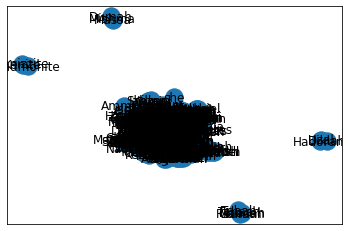

In [308]:
nx.draw_networkx(inter_nx)

From the elementary network, we can see that the entities are mainly divided into 5 groups in terms of their interactions.Let's take a look at each group.

In [309]:
group_1 = list(nx.connected_components(inter_nx))[0]
group_2 = list(nx.connected_components(inter_nx))[1]
group_3 = list(nx.connected_components(inter_nx))[2]
group_4 = list(nx.connected_components(inter_nx))[3]
group_5 = list(nx.connected_components(inter_nx))[4]
inter_1 = nx.subgraph(inter_nx, group_1)
inter_2 = nx.subgraph(inter_nx, group_2)
inter_3 = nx.subgraph(inter_nx, group_3)
inter_4 = nx.subgraph(inter_nx, group_4)
inter_5 = nx.subgraph(inter_nx, group_5)

In [310]:
def get_plot(graph):
    layout = nx.spring_layout(graph, weight='weight', iterations= 100)
    fig, ax = plt.subplots(figsize = (10,10))
    nx.draw(graph, ax = ax, pos = layout, labels = {n:n for n in graph.nodes()},
            width= .2,
            alpha = .9, 
            node_size = 100,
            node_color = "xkcd:light red",
            edge_color='xkcd:sky blue')

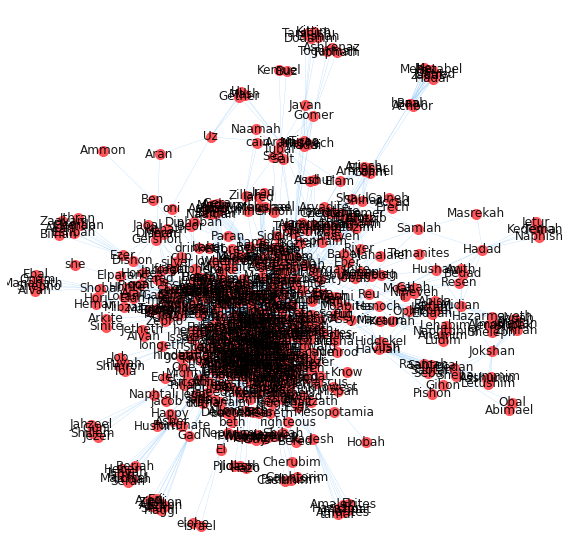

In [311]:
get_plot(inter_1)

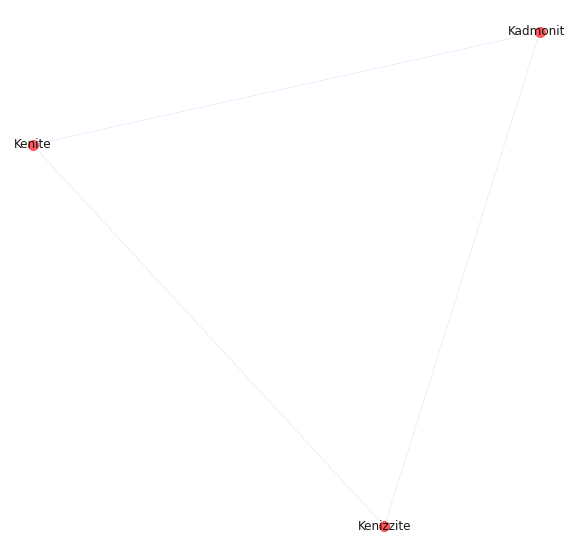

In [312]:
get_plot(inter_2)

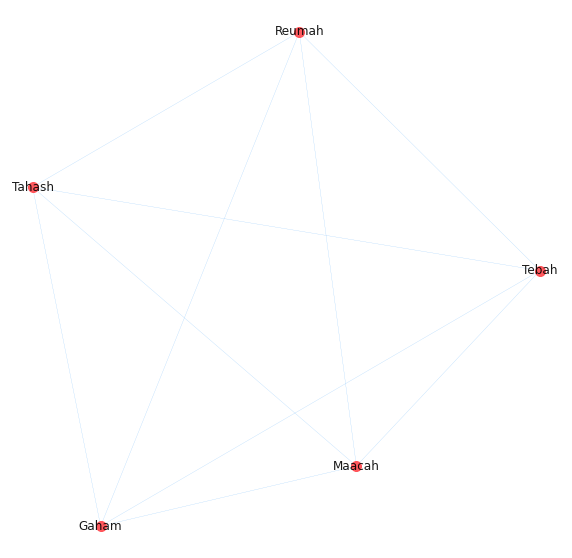

In [313]:
get_plot(inter_3)

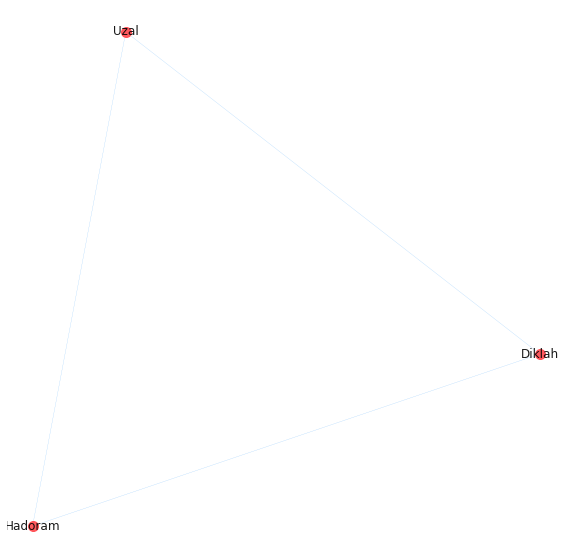

In [314]:
get_plot(inter_4)

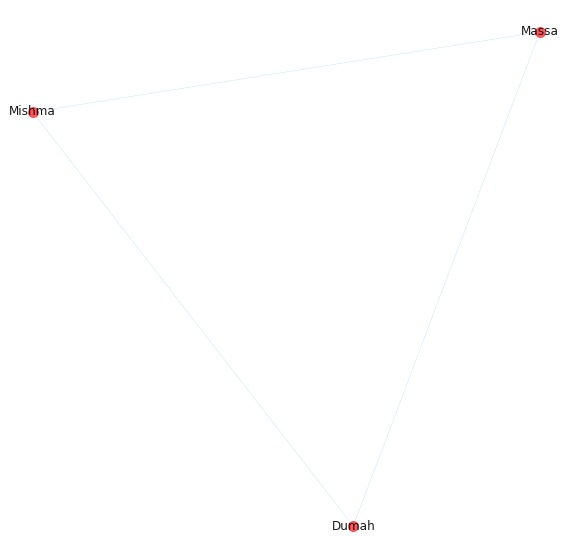

In [315]:
get_plot(inter_5)

Now we can draw a heatmap to see the their relations.

In [316]:
L = []
for node in inter_nx.nodes():
    l = []
    for node_ in inter_nx.nodes():
        if node == node_ or (not inter_nx.has_edge(node, node_)):
            l.append(0)
        else:
            l.append(inter_nx.edges[node,node_]['weight'])
    L.append(l)
M_ = np.array(L)

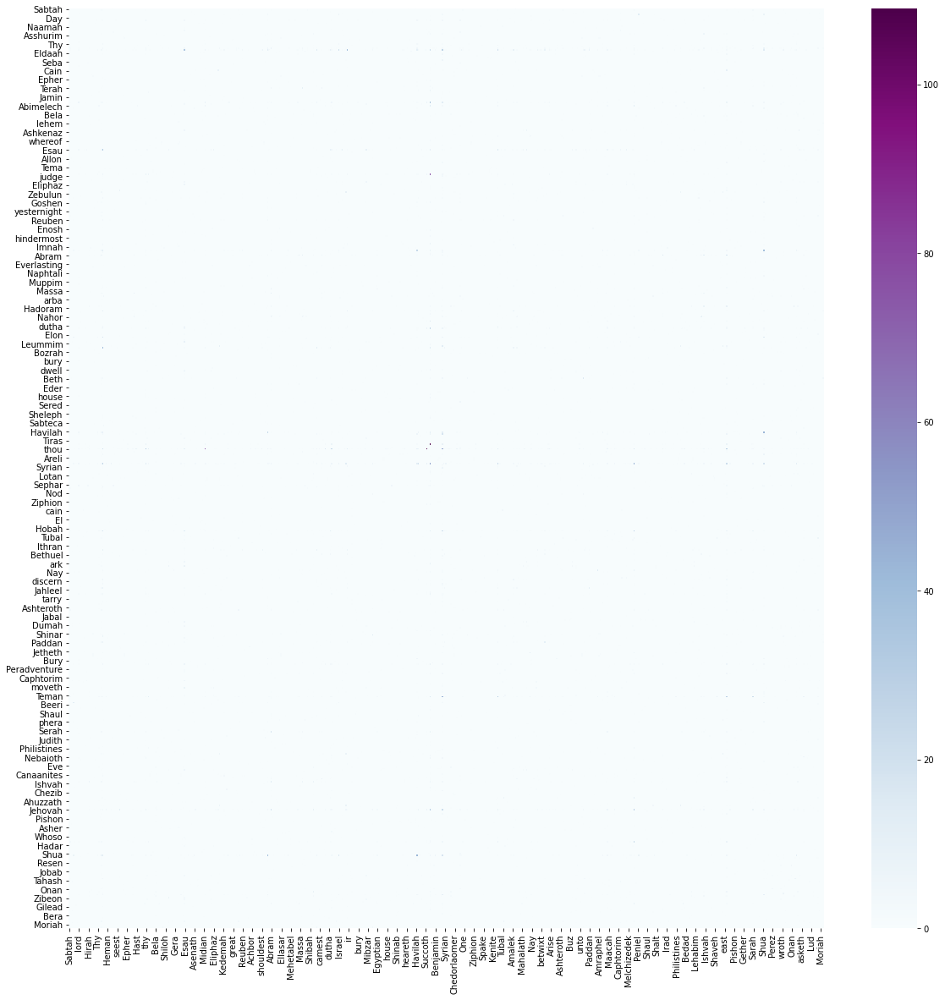

In [317]:
fig, ax = plt.subplots(figsize = (20,20))
div = pandas.DataFrame(M_, columns = list(inter_nx.nodes()), index = list(inter_nx.nodes()))
seaborn.heatmap(div,cmap = "BuPu")
plt.show()

According to the above heatmap, we can see that most of the links are very weak (with little weight). Now let's remove node pairs whose weight is less than 5 and nodes who have less than 5 neighbors.

In [318]:
inter_nx.remove_edges_from([(n1, n2) for n1, n2, d in inter_nx.edges(data = True) if d['weight'] < 5])
inter_nx.remove_nodes_from([n for n in inter_nx.nodes if len(set(inter_nx.neighbors(n))) < 5]) 

L = []
for node in inter_nx.nodes():
    l = []
    for node_ in inter_nx.nodes():
        if node == node_ or (not inter_nx.has_edge(node, node_)):
            l.append(0)
        else:
            l.append(inter_nx.edges[node,node_]['weight'])
    L.append(l)
M_ = np.array(L)
fig, ax = plt.subplots(figsize = (20,20))
div = pandas.DataFrame(M_, columns = list(inter_nx.nodes()), index = list(inter_nx.nodes()))
sns.heatmap(div,cmap = "BuPu")
plt.show()

In [319]:
print(nx.info(inter_nx))

Name: 
Type: Graph
Number of nodes: 23
Number of edges: 74
Average degree:   6.4348


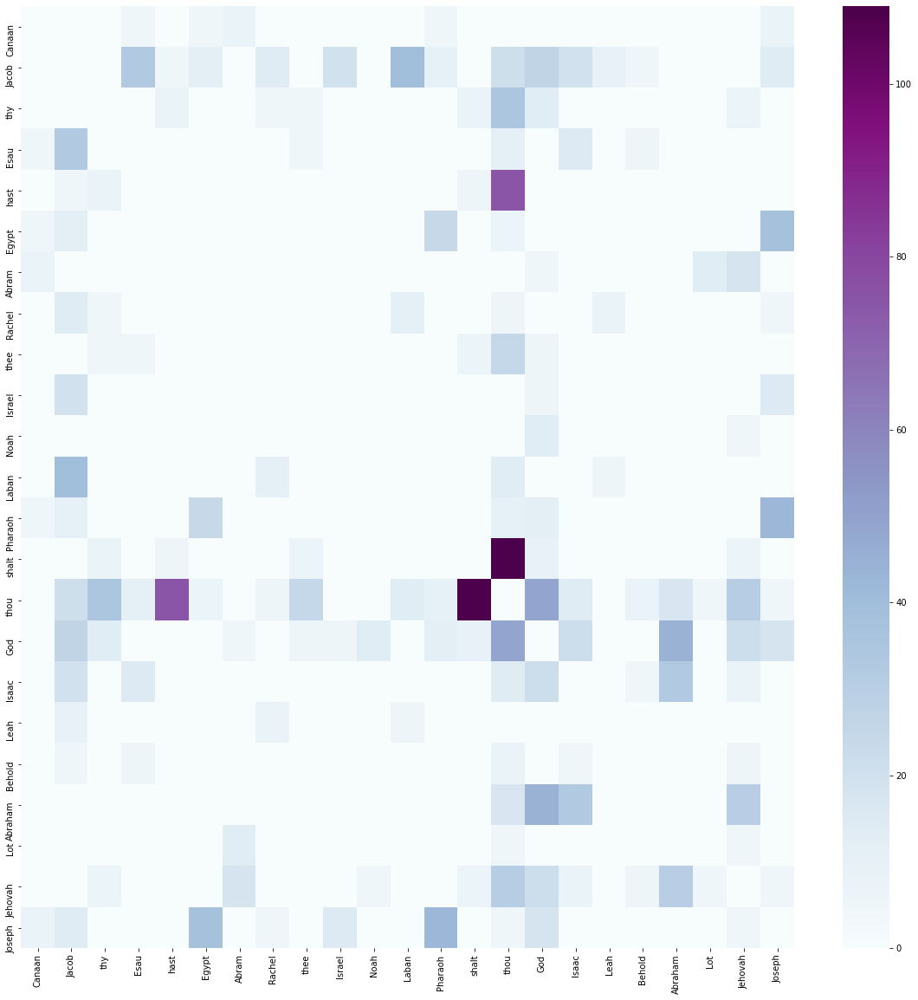

In [320]:
L = []
for node in inter_nx.nodes():
    l = []
    for node_ in inter_nx.nodes():
        if node == node_ or (not inter_nx.has_edge(node, node_)):
            l.append(0)
        else:
            l.append(inter_nx.edges[node,node_]['weight'])
    L.append(l)
M_ = np.array(L)
fig, ax = plt.subplots(figsize = (20,20))
div = pandas.DataFrame(M_, columns = list(inter_nx.nodes()), index = list(inter_nx.nodes()))
seaborn.heatmap(div,cmap = "BuPu")
plt.show()

From the heat map, we found that ‘shalt’ and ‘thou’ interact a lot. They originally meant "you should". Since they are Old English, our algorithm also classifies them into proper nouns. Based on our experience of reading the Bible, it is true that this combination appears many times in the Bible. 

In addition, we saw a lot of interaction between Pharaoh and Joseph.In Genesis, Joseph's jealous brother sold him to slavery. Later, Joseph rose to Vizier, the second most powerful man in Egypt after the Pharaoh.

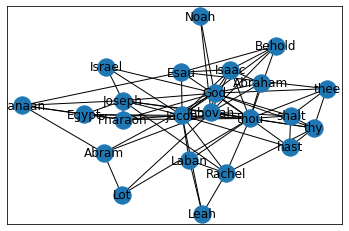

In [321]:
nx.draw_networkx(inter_nx)

Let's calculate the communities.

In [322]:
c_inter = list(greedy_modularity_communities(inter_nx))
print(c_inter)

[frozenset({'Rachel', 'Egypt', 'Isaac', 'hast', 'Abram', 'Behold', 'Lot', 'Pharaoh', 'Leah', 'shalt', 'thee', 'thou', 'Jehovah', 'Esau', 'Joseph', 'Canaan', 'Jacob', 'thy', 'Israel', 'Abraham', 'Noah', 'Laban', 'God'})]


Let's calculate the centrality measurements.

In [323]:
dcentralities_inter = nx.degree_centrality(inter_nx)
print(dcentralities_inter)

{'Canaan': 0.2272727272727273, 'Jacob': 0.5909090909090909, 'thy': 0.3181818181818182, 'Esau': 0.2727272727272727, 'hast': 0.18181818181818182, 'Egypt': 0.2272727272727273, 'Abram': 0.18181818181818182, 'Rachel': 0.2727272727272727, 'thee': 0.2272727272727273, 'Israel': 0.13636363636363635, 'Noah': 0.09090909090909091, 'Laban': 0.18181818181818182, 'Pharaoh': 0.2727272727272727, 'shalt': 0.2727272727272727, 'thou': 0.7727272727272727, 'God': 0.5909090909090909, 'Isaac': 0.3181818181818182, 'Leah': 0.13636363636363635, 'Behold': 0.2272727272727273, 'Abraham': 0.18181818181818182, 'Lot': 0.13636363636363635, 'Jehovah': 0.5, 'Joseph': 0.4090909090909091}


In [324]:
sorted(dcentralities_inter.items(), key=lambda x: x[1])

[('Noah', 0.09090909090909091),
 ('Israel', 0.13636363636363635),
 ('Leah', 0.13636363636363635),
 ('Lot', 0.13636363636363635),
 ('hast', 0.18181818181818182),
 ('Abram', 0.18181818181818182),
 ('Laban', 0.18181818181818182),
 ('Abraham', 0.18181818181818182),
 ('Canaan', 0.2272727272727273),
 ('Egypt', 0.2272727272727273),
 ('thee', 0.2272727272727273),
 ('Behold', 0.2272727272727273),
 ('Esau', 0.2727272727272727),
 ('Rachel', 0.2727272727272727),
 ('Pharaoh', 0.2727272727272727),
 ('shalt', 0.2727272727272727),
 ('thy', 0.3181818181818182),
 ('Isaac', 0.3181818181818182),
 ('Joseph', 0.4090909090909091),
 ('Jehovah', 0.5),
 ('Jacob', 0.5909090909090909),
 ('God', 0.5909090909090909),
 ('thou', 0.7727272727272727)]

We can see that Jacob is the most central person (since 'thou' should not be a person), and Noah is the least central one.

In the following step, we will analyzed the similarity between each pair of people in terms of their actions and see their similarity.

In [325]:
token_docs = bible.nlp_text.to_list()

In [326]:
def token_is_subject_with_action(token):
    nsubj = token.dep_ == 'nsubj'
    head_verb = token.head.pos_ == 'VERB'
    person = token.ent_type_ == 'PERSON'
    return nsubj and head_verb and person

actors_and_actions = []
for verse, doc in enumerate(token_docs):
    for token in doc:
        if token_is_subject_with_action(token):
            span = doc[token.head.left_edge.i:token.head.right_edge.i+1]
            data = dict(name=token.orth_,
                        span=span.text,
                        verb=token.head.lower_,
                        log_prob=token.head.prob,
                        verse=verse)
            actors_and_actions.append(data)
action_df = pd.DataFrame(actors_and_actions)

##### Note: The above chunk of code is from the reference of https://www.jiqizhixin.com/articles/2018-06-23-2.

In [327]:
people = list(action_df.name.unique())

We can distinguish that some of the 'names' are not actually a name. However, they reveal some commands from the God. Therefore, here we still keep them.

#### KS as measurement and graph visualizaiton

In [328]:
actions_info = {}
for person in people:
    actions_info[person] = []

In [329]:
for info in actors_and_actions:
    actions_info[info['name']].append(info['verb'])

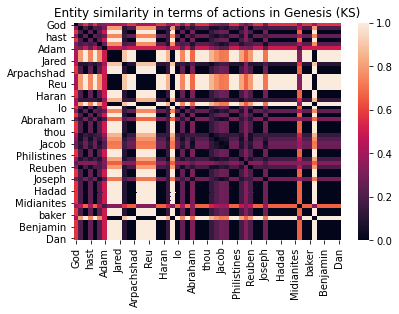

In [330]:
corpora = list(actions_info.values())
L = []
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = people, index = people)
ax = seaborn.heatmap(div)
plt.title('Entity similarity in terms of actions in Genesis (KS)')
plt.show()

Interaction Network (KS)


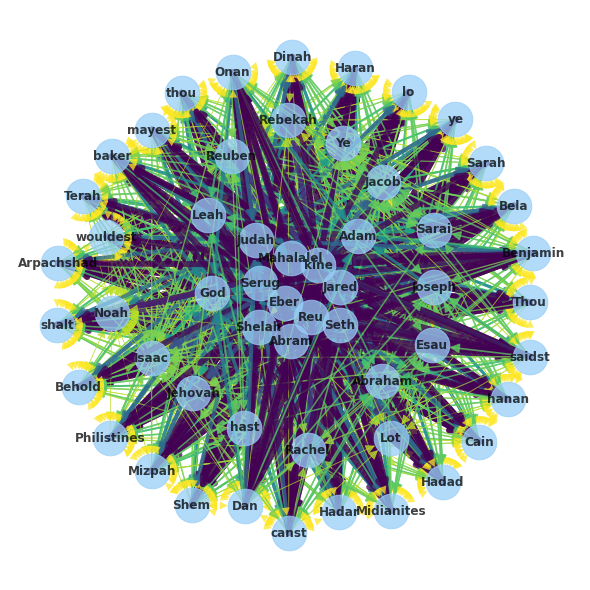

In [331]:
g_ks = drawNetwork(div,'Interaction Network (KS)')

#### Chi2 as measurement and graph visualizaiton

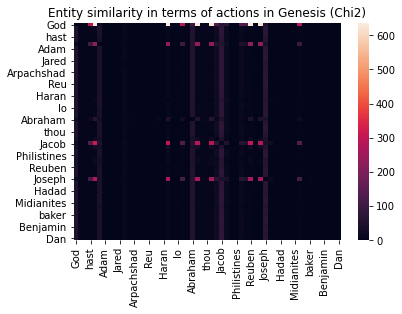

In [332]:
corpora = list(actions_info.values())
L = []
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference='Chi2'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = people, index = people)
ax = seaborn.heatmap(div)
plt.title('Entity similarity in terms of actions in Genesis (Chi2)')
plt.show()

Interaction Network (Chi2)


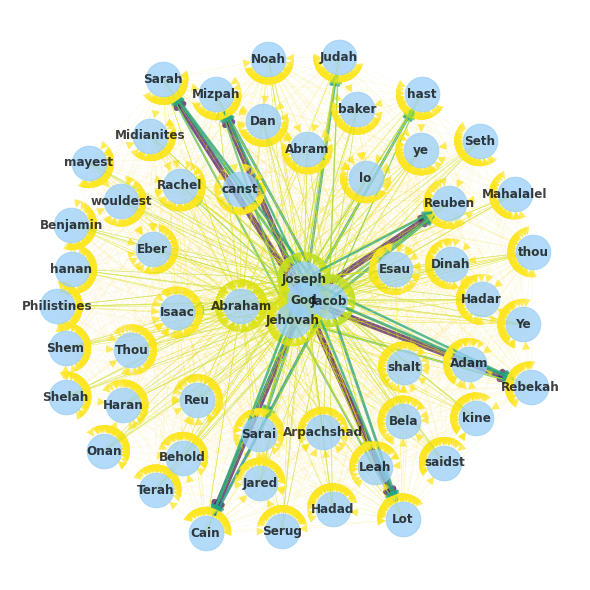

In [333]:
g_chi2 = drawNetwork(div,'Interaction Network (Chi2)')

### KL as measurement and graph visualizaiton

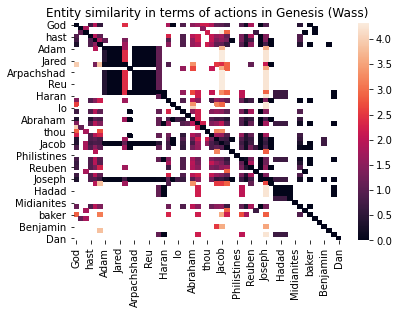

In [334]:
corpora = list(actions_info.values())
L = []
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = people, index = people)
ax = seaborn.heatmap(div)
plt.title('Entity similarity in terms of actions in Genesis (Wass)')
plt.show()

In [335]:
div = div.fillna(0)

Interaction Network (KL)


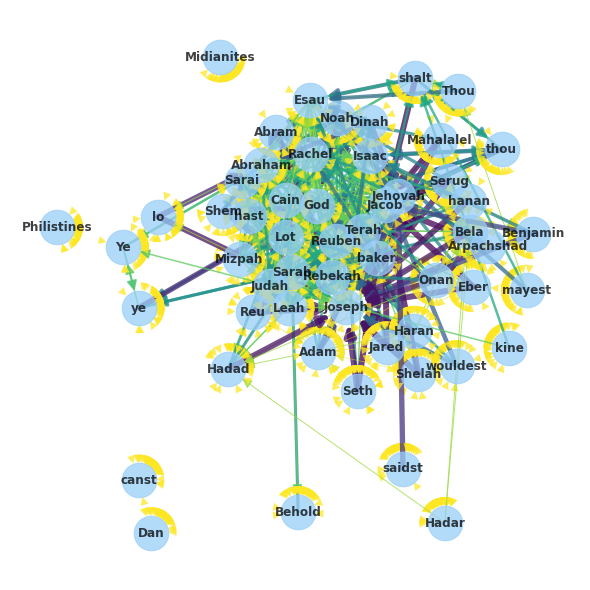

In [336]:
g_kl = drawNetwork(div,'Interaction Network (KL)')

### spaCy function as measurement and graph visualization

In [337]:
corpora_sentence = []
for i in corpora:
    sentence = ' '.join(i)
    corpora_sentence.append(nlp(sentence))

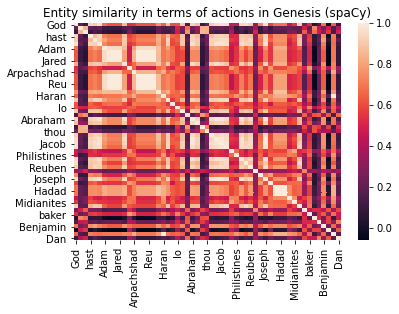

In [338]:
L = []
for p in corpora_sentence:
    l = []
    for q in corpora_sentence:
        l.append(p.similarity(q))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = people, index = people)
ax = seaborn.heatmap(div)
plt.title('Entity similarity in terms of actions in Genesis (spaCy)')
plt.show()

Interaction Network (spaCy)


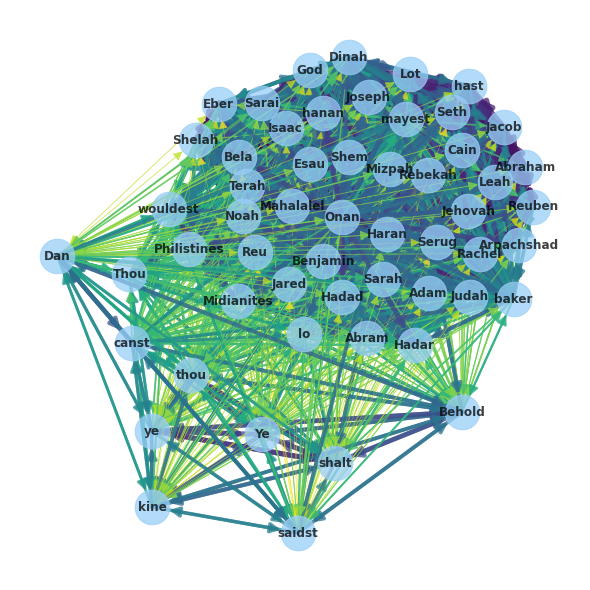

In [339]:
g_spacy = drawNetwork(div,'Interaction Network (spaCy)')

Conclusion:
From the above analysis, we can see that under different measurements, the degree of interaction between different pairs of people is different. However, we can see ethat people like Jared, Adam and Jacob always have relatively strong interaction with others.

## Conversational Analysis using ConvoKit

The accompanying notebook [convokit](https://github.com/Computational-Content-Analysis-2020/Content-Analysis-2020/blob/master/week-4/convokit.ipynb) demonstrates the capacities of CornellNLP's package convokit, which provides multiple ways to analyse networks of conversations.

There are 6 different approaches illustrated:

1. Measures of linguistic coordination
2. Politeness strategy
3. Prompt type
4. Hypergraph conversation representation
5  Linguistic diversity in conversations
6. Forecasting of conversation outcomes

The examples illustrate these methods using the built in datasets which ConvoKit offers. This [Jupyter notebook](https://github.com/CornellNLP/Cornell-Conversational-Analysis-Toolkit/blob/master/examples/converting_movie_corpus.ipynb) demonstrates how to convert your own corpora so that you can easily use the metrics provided in convokit. 

## <span style="color:red">*Exercise 5*</span>

<span style="color:red"> Implement one (or more) of the metrics from ConvoKit on your dataset of choice; what does it reveal about the social game of your dataset?

In [340]:
import lucem_illud_2020
import os

import numpy as np
import pandas as pd
from scipy import stats

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, LeaveOneGroupOut
from sklearn.feature_selection import f_classif, SelectPercentile

from collections import defaultdict
from functools import partial
from multiprocessing import Pool

import convokit
from convokit import download
from convokit.prompt_types import PromptTypeWrapper
from convokit import PolitenessStrategies
from convokit import Corpus

import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [353]:
corpus = Corpus(filename=download("parliament-corpus"))
coord = convokit.Coordination()
coord.fit(corpus)

# get coordination scores
coord.transform(corpus)

We would like to explore the relationship between the members of Conservative Party and all the members.

In [370]:
everyone = list(corpus.iter_users())
print("Conservative parliamentaries, ranked by how much they coordinate to others:")

Conservative parliamentaries, ranked by how much they coordinate to others:


In [382]:
conservatives = []
for person in everyone:
    if person.get_info('last_party') == 'conservative':
        conservatives.append(person)

In [419]:
link_dict = {}
consers_to_everyone = coord.score(corpus, conservatives, everyone)
for conservative, score in sorted(consers_to_everyone.averages_by_user().items(),
    key=lambda x: x[1], reverse=True):
    print(conservative.meta['name'], round(score, 5))
    link_dict[conservative.meta['name']] = [score]
print()

Michael Ellis 0.05283
John Major 0.04692
David Atkinson 0.03466
Richard Ottaway 0.03333
Brooks Newmark 0.02489
Paul Maynard 0.02176
Gavin Barwell 0.02162
Patrick Cormack 0.02083
Robert Halfon 0.01925
Andrew Percy 0.01572
Rory Stewart 0.01353
James Arbuthnot 0.01351
Tim Yeo 0.01245
Edward Garnier 0.01189
Guto Bebb 0.01139
Michael Heseltine 0.0113
Jo Johnson 0.01123
Cheryl Gillan 0.01122
Desmond Swayne 0.01074
Nicola Blackwood 0.0098
Jonathan Djanogly 0.00976
Alastair Goodlad 0.00972
Paul Beresford 0.0093
Andrew Jones 0.00897
Gerald Howarth 0.00879
Ray Whitney 0.00874
Damian Hinds 0.00845
Penny Mordaunt 0.00825
Margot James 0.00823
Owen Paterson 0.00822
Justin Tomlinson 0.00812
Sydney Chapman 0.0081
John MacGregor 0.00809
James Wharton 0.00807
George Young 0.00799
Liam Fox 0.00783
John Stanley 0.00747
Oliver Heald 0.00742
Harriett Baldwin 0.00727
Kris Hopkins 0.0072
Priti Patel 0.00696
Archie Hamilton 0.00694
Stephen Dorrell 0.00691
John Maples 0.00686
Sajid Javid 0.00675
Gary Streeter 0

In [420]:
# compute coordination from everyone to each conservative
print("Conservative parliamentaries, ranked by how much others coordinate to them:")
everyone_to_conservatives = coord.score(corpus, everyone, conservatives, focus="targets")
for conservative, score in sorted(everyone_to_conservatives.averages_by_user().items(), 
    key=lambda x: x[1], reverse=True):
    name_temp = conservative.meta['name']
    print(name_temp, round(score, 5))
    if name_temp in link_dict.keys():
        link_dict[name_temp].append(score)
print()

Conservative parliamentaries, ranked by how much others coordinate to them:
John Taylor 0.04256
Michael Trend 0.04039
Anne-Marie Trevelyan 0.0303
John Major 0.02997
Michael Mates 0.02698
John Randall 0.02655
Simon Hart 0.02562
Brooks Newmark 0.02216
Aidan Burley 0.02208
Conor Burns 0.02083
John Horam 0.02005
Scott Mann 0.01993
Victoria Prentis 0.01903
Alan Duncan 0.01898
Teresa Gorman 0.01833
Peter Lloyd 0.01801
Jacqui Lait 0.01731
Paul Uppal 0.01717
Alok Sharma 0.01623
Keith Simpson 0.01616
Damian Collins 0.01587
Victoria Atkins 0.01548
Steve Double 0.01534
Michael Shersby 0.01496
James Berry 0.01481
Heidi Allen 0.01481
Tania Mathias 0.01477
Desmond Swayne 0.01448
Peter Tapsell 0.01436
Stephen Barclay 0.01402
Amber Rudd 0.01393
Chris Heaton-Harris 0.01391
Richard Harrington 0.01384
Christopher Gill 0.01363
Craig Whittaker 0.01353
Oliver Heald 0.01341
Andrew Tyrie 0.01338
Paul Goodman 0.01337
Nick Hawkins 0.01337
Andrew Griffiths 0.01336
Nadhim Zahawi 0.01294
David Curry 0.01279
Amanda

In [421]:
people = link_dict.keys()
coordination_sent = [i[0] for i in link_dict.values()]
coordination_received = [i[1] for i in link_dict.values()]
coordination = pd.DataFrame({'Parliamentaries':people,'coordination to others':coordination_sent,
                             'others coordinate to them':coordination_received})

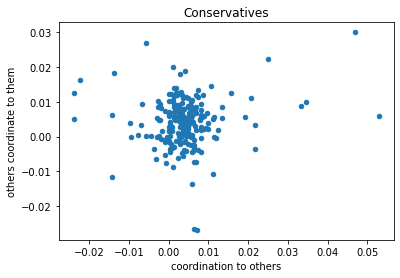

In [424]:
coordination.plot.scatter(x='coordination to others',y = 'others coordinate to them',title = 'Conservatives')

We only pay attention to parliamentaries who send and also receive coordination. We can see from the picture that the more conservatives who coordinate with others usually receive more coordination. But the absolute value of their coordination is not very high. We guess that they may not often adopt the coordination strategy. Let's compare the Labor Party again.

Jeremy Corbyn 0.05
Barry Jones 0.04762
Kevin Barron 0.04444
Norman Godman 0.02917
Alice Mahon 0.02778
Harry Cohen 0.02698
Alan Meale 0.02383
Peter Temple-Morris 0.02041
Tom Cox 0.02041
Ian Lucas 0.01822
Harry Barnes 0.01429
Karen Buck 0.01417
Michael Jabez Foster 0.01389
Claire Ward 0.01345
David Clark 0.01231
Keith Vaz 0.01141
Chris Bryant 0.01119
Joan Ruddock 0.01106
Barry Gardiner 0.01056
Frank Doran 0.01042
Paddy Tipping 0.01009
Sarah McCarthy-Fry 0.00991
Nigel Griffiths 0.00983
Jack Cunningham 0.00973
Glenda Jackson 0.00955
Win Griffiths 0.0092
Tony Lloyd 0.00868
David Jamieson 0.00857
Tony Worthington 0.00845
David Cairns 0.00842
Sally Keeble 0.00836
Jack Straw 0.00823
Lynda Clark 0.00822
Barbara Follett 0.00795
John Morris 0.00789
Ann Keen 0.00778
Frank Dobson 0.00736
Chris Mole 0.00726
George Foulkes 0.00725
Nick Raynsford 0.00706
Helen Goodman 0.0069
Alan Howarth 0.0068
Kevan Jones 0.00674
Gillian Merron 0.00656
David Kidney 0.00648
Paul Clark 0.00646
Jim Knight 0.00632
Alun M

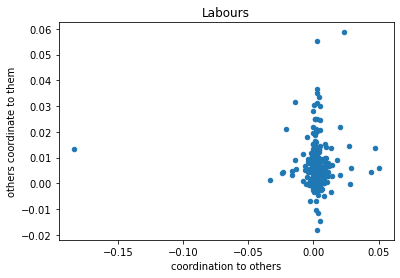

In [425]:
labours = []
for person in everyone:
    if person.get_info('last_party') == 'labour':
        labours.append(person)
        
link_dict = {}
labours_to_everyone = coord.score(corpus, labours, everyone)
for labour, score in sorted(labours_to_everyone.averages_by_user().items(),
    key=lambda x: x[1], reverse=True):
    print(labour.meta['name'], round(score, 5))
    link_dict[labour.meta['name']] = [score]
print()

# compute coordination from everyone to each conservative
print("Labour parliamentaries, ranked by how much others coordinate to them:")
everyone_to_labours = coord.score(corpus, everyone, labours, focus="targets")
for labour, score in sorted(everyone_to_labours.averages_by_user().items(), 
    key=lambda x: x[1], reverse=True):
    name_temp = labour.meta['name']
    print(name_temp, round(score, 5))
    if name_temp in link_dict.keys():
        link_dict[name_temp].append(score)
print()

people = link_dict.keys()
coordination_sent = [i[0] for i in link_dict.values()]
coordination_received = [i[1] for i in link_dict.values()]
coordination_labour = pd.DataFrame({'Parliamentaries':people,'coordination to others':coordination_sent,
                             'others coordinate to them':coordination_received})

coordination_labour.plot.scatter(x='coordination to others',y = 'others coordinate to them',title = 'Labours')

In contrast, the coordination statistics of Labor Party parliamentaries are more discrete. They receive more coordination from others than the Conservatives, but most of them coordinate with others around 0.